### Import

In [ ]:
import os

from tqdm.auto import tqdm

import pandas as pd
import numpy as np

import random

import re

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision.ops.boxes as bops

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.patches import Rectangle

import seaborn as sns

import PIL
from PIL import Image

from collections import Counter

import shutil
import pathlib
from pathlib import Path

from patched_yolo_infer import (visualize_results_usual_yolo_inference)
import cv2
import time

import yaml

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
!nvidia-smi
torch.cuda.is_available()

Sat Oct 12 06:51:02 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 556.13                 Driver Version: 556.13         CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650 Ti   WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   55C    P8              2W /   50W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

True

In [ ]:
#настроим random_seed всего
seed_num = 13
torch.manual_seed(seed_num)
torch.cuda.manual_seed(seed_num)
torch.cuda.manual_seed_all(seed_num)
torch.use_deterministic_algorithms(True) # do not work in collab
np.random.seed(seed_num)

import torch.backends.cudnn
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True # do not work in collab

In [ ]:
abs_path = os.getcwd()
project_path = r'F:\DS\Хахатон_10.2024'
project_path

'F:\\DS\\Хахатон_10.2024'

### Dataset

In [ ]:
pip install pyzipper

   ---------------------------------------- 67.7/67.7 kB 3.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: pytorch-lightning 1.5.4 has a non-standard dependency specifier torch>=1.7.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import pyzipper

zip_file_path = os.path.join(project_path, 'train_dataset_minpromtorg_train_dataset.zip')
password = b'cifrovoy_proryv_2024_mpt_bpla'

def decrypt(zip_file_path, password):
    with pyzipper.AESZipFile(zip_file_path, 'r', compression=pyzipper.ZIP_LZMA, encryption=pyzipper.WZ_AES) \
            as extracted_zip:
        try:
            extracted_zip.extractall(pwd = password)
        except RuntimeError as ex:
            print(ex)


decrypt(zip_file_path, password)

##### Dataset check

In [ ]:
plane_list = os.listdir(os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'images'))
print('Фоток с самолетами', len(plane_list))

heli_list = os.listdir(os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'images'))
print('Фоток с вертолетами', len(heli_list))

Фоток с самолетами 61612
Фоток с вертолетами 19960


In [ ]:
# look how it should like

def show_debug(name):
    img_name = name + '.jpg'
    debug_path = r'F:\DS\Хахатон_10.2024\Dataset\Dataset_photo\0-plane\debug'
    img = plt.imread(os.path.join(debug_path, img_name))

    plt.imshow(img);

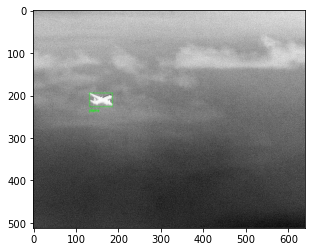

In [ ]:
show_debug('14052021_(t3)@ds-1207')

In [ ]:
# check bboxes from labels

def show_pics(name):
    img_name = name + '.jpg'
    img = plt.imread(os.path.join(plane_image_path, img_name))
    img_h, img_w, can = img.shape
    label_name = name + '.txt'
    label_path = r'F:\DS\Хахатон_10.2024\Dataset\Dataset_photo\0-plane\labels'
    with open(os.path.join(label_path, label_name), "r") as f:
        res = f.read()
        res_list = [float(x) for x in res.split(' ')]

    fig, ax = plt.subplots()
    plt.axis('off')
    x = res_list[1]*img_w - 0.5*(res_list[3]*img_w)
    y = res_list[2]*img_h - 0.5*(res_list[4]*img_h)
    width = res_list[3]*img_w
    height = res_list[4]*img_h
    plt.gca().add_patch(Rectangle((x, y), width, height,
                        edgecolor='green',
                        facecolor='none',
                        lw=2))
    plt.imshow(img);

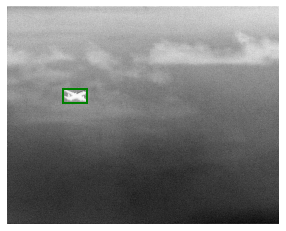

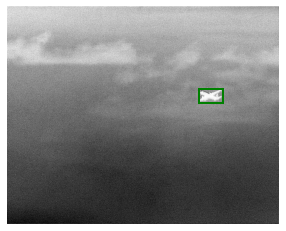

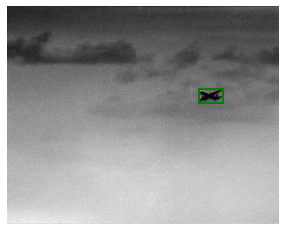

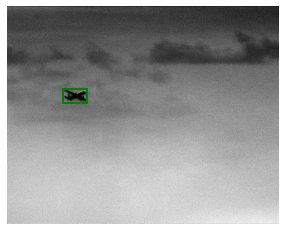

In [ ]:
names_list = ['14052021_(t3)@ds-1207', '14052021_(t3)@ds-1207-aughor', '14052021_(t3)@ds-1207-aughor-inv', '14052021_(t3)@ds-1207-inv']

for i in range(4):
    show_pics(names_list[i])

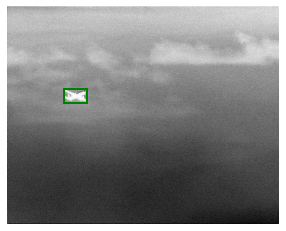

In [ ]:
show_pics('14052021_(t3)@ds-1206')

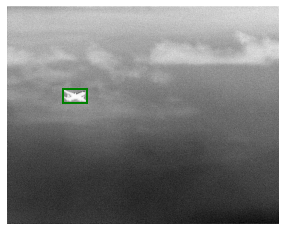

In [ ]:
show_pics('14052021_(t3)@ds-1205')

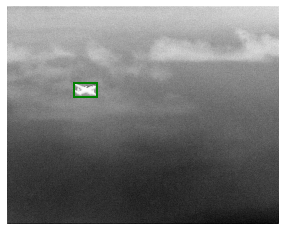

In [ ]:
show_pics('14052021_(t3)@ds-1218')

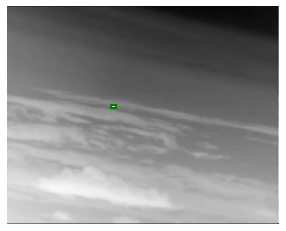

In [ ]:
show_pics('Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0509')

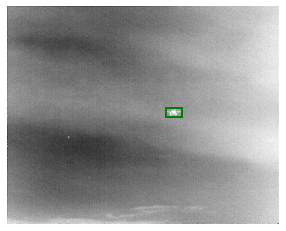

In [ ]:
show_pics('14052021_(t14)@ds-0052')

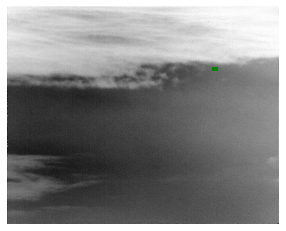

In [ ]:
show_pics('14052021_(t19)@ds-0175')

##### labels look OK

### Model

In [ ]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO10n model
model = YOLO("yolov10n.pt")

model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
model.names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

In [ ]:
# Run inference on pretrained
results = model(os.path.join(plane_image_path, '14052021_(t3)@ds-1207.jpg'))
results[0].show()

C:\Users\serge\anaconda3\lib\site-packages\huggingface_hub\utils\_runtime.py:185: UserWarning: Pydantic is installed but cannot be imported. Please check your installation. `huggingface_hub` will default to not using Pydantic. Error message: '{e}'
  warnings.warn(


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1207.jpg: 512x640 (no detections), 60.2ms
Speed: 6.4ms preprocess, 60.2ms inference, 18.8ms postprocess per image at shape (1, 3, 512, 640)


In [ ]:
results = model(os.path.join(plane_image_path, '14052021_(9)@ds-2080.jpg'))
results[0].show()


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-2080.jpg: 512x640 1 bird, 94.1ms
Speed: 0.0ms preprocess, 94.1ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)


In [ ]:
results = model(os.path.join(plane_image_path, '14052021_(t3)@ds-0407.jpg'))
results[0].show()


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0407.jpg: 512x640 (no detections), 91.4ms
Speed: 5.0ms preprocess, 91.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


In [ ]:
results = model(os.path.join(plane_image_path, '14052021_(t3)@ds-1225.jpg'))
results[0].show()


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1225.jpg: 512x640 (no detections), 98.0ms
Speed: 0.0ms preprocess, 98.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)


In [ ]:
results = model(os.path.join(plane_image_path, '14052021_(t3)@ds-1748.jpg'))
results[0].show()


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1748.jpg: 512x640 1 airplane, 78.5ms
Speed: 3.1ms preprocess, 78.5ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)


##### Pretrained model can detect birds, but cannot detect planes

### Try small dataset for small model

##### Dataset preparation according to Yolo instructions

In [ ]:
os.makedirs(os.path.join(project_path, 'baseline_dataset', 'train', 'images'))
os.makedirs(os.path.join(project_path, 'baseline_dataset', 'train', 'labels'))
os.makedirs(os.path.join(project_path, 'baseline_dataset', 'val', 'images'))
os.makedirs(os.path.join(project_path, 'baseline_dataset', 'val', 'labels'))

In [ ]:
# проверка директории
def tree(path=(os.path.join(project_path, 'baseline_dataset')), head='', tail=''):
    path = Path(path)
    if path.is_dir():
        print(head + path.name)
        entries = sorted(filter(Path.is_dir, path.iterdir()))
        for i, entry in enumerate(entries):
            if i < len(entries) - 1:
                tree(entry, tail + '├──', tail + '│  ')
            else:
                tree(entry, tail + '└──', tail + '   ')

tree()

baseline_dataset
├──train
│  ├──images
│  └──labels
└──val
   ├──images
   └──labels


In [ ]:
print('Фоток с самолетами', len(plane_list))

debug_plane_list = os.listdir(os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'debug'))
print('debug_Фоток с самолетами', len(debug_plane_list))

print('Фоток с вертолетами', len(heli_list))

debug_heli_list = os.listdir(os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'debug'))
print('debug_Фоток с вертолетами', len(debug_heli_list))

Фоток с самолетами 61612
debug_Фоток с самолетами 16088
Фоток с вертолетами 19960
debug_Фоток с вертолетами 5489


In [ ]:
short_debug_plane_list = debug_plane_list[:-6000:10]
short_debug_heli_list = debug_heli_list[::5]

In [ ]:
print(len(short_debug_plane_list))
print(len(short_debug_heli_list))

1009
1098


In [ ]:
plane_image_path = r'F:\DS\Хахатон_10.2024\Dataset\Dataset_photo\0-plane\images'
plane_label_path = r'F:\DS\Хахатон_10.2024\Dataset\Dataset_photo\0-plane\labels'

heli_image_path = r'F:\DS\Хахатон_10.2024\Dataset\Dataset_photo\1-helicopter\images'
heli_label_path = r'F:\DS\Хахатон_10.2024\Dataset\Dataset_photo\1-helicopter\labels'

In [ ]:
for i in range(len(short_debug_plane_list)):
    name = short_debug_plane_list[i][:-4:]
    img_name = name + '.jpg'
    label_name = name + '.txt'
    #print(img_name)
    if img_name in plane_list:
        if i % 20 != 0:
            # копируем картинку
            shutil.copy2(os.path.join(plane_image_path, img_name), os.path.join(project_path, 'baseline_dataset', 'train', 'images'), follow_symlinks=True)
            # копируем label
            shutil.copy2(os.path.join(plane_label_path, label_name), os.path.join(project_path, 'baseline_dataset', 'train', 'labels'), follow_symlinks=True)
        else:
            shutil.copy2(os.path.join(plane_image_path, img_name), os.path.join(project_path, 'baseline_dataset', 'val', 'images'), follow_symlinks=True)
            shutil.copy2(os.path.join(plane_label_path, label_name), os.path.join(project_path, 'baseline_dataset', 'val', 'labels'), follow_symlinks=True)

In [ ]:
for i in range(len(short_debug_heli_list)):
    name = short_debug_heli_list[i][:-4:]
    img_name = name + '.jpg'
    label_name = name + '.txt'
    print(img_name)
    if img_name in heli_list:
        if i % 20 != 0:
            # копируем картинку
            shutil.copy2(os.path.join(heli_image_path, img_name), os.path.join(project_path, 'baseline_dataset', 'train', 'images'), follow_symlinks=True)
            # копируем label
            shutil.copy2(os.path.join(heli_label_path, label_name), os.path.join(project_path, 'baseline_dataset', 'train', 'labels'), follow_symlinks=True)
        else:
            shutil.copy2(os.path.join(heli_image_path, img_name), os.path.join(project_path, 'baseline_dataset', 'val', 'images'), follow_symlinks=True)
            shutil.copy2(os.path.join(heli_label_path, label_name), os.path.join(project_path, 'baseline_dataset', 'val', 'labels'), follow_symlinks=True)

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0001.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0006.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0011.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0016.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0021.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0026.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0031.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0036.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0041.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0046.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0051.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0056.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0061.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0066.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0071.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0076.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0081.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0086.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0091.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0096.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0101.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0107.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0112.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0117.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0122.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0127.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0132.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0137.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1405.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1410.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1415.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1420.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1425.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1430.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1435.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1440.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1445.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1450.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1455.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1461.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1466.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1471.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1476.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1481.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1486.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1491.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1496.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0005.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0011.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0016.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0022.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0027.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0033.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0315.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0320.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0325.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0330.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0335.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0340.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0345.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0350.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0355.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0360.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0365.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0370.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0375.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0380.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0385.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0390.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0395.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0400.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0405.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0410.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0416.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1244.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1249.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1254.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1259.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1264.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1269.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1274.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1279.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1284.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1289.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1294.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1299.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1304.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1309.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1314.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1319.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1324.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1329.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1334.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1339.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1344.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1073.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1078.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1084.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1089.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1094.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1099.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1104.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1109.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1114.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1119.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1124.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1129.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1134.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1139.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1144.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1149.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1154.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0006.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0011.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0016.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0021.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0026.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0031.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0036.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0041.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0046.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0051.jpg
27042

27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0018.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0023.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0028.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0033.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0039.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0044.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0049.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0054.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0059.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0064.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0069.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0074.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0079.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0084.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0089.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0094.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0099.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0104.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0110.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0115.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0120.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0125.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0130.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0135.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0141.jpg


In [ ]:
# проверка
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'train', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'train', 'labels'))))
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'val', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'val', 'labels'))))

1855
1855
98
98


In [ ]:
# добавим в трейн еще backgrounds
empty_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', 'backgrounds', 'images')

empty_list = os.listdir(empty_path)

for i in empty_list:
    shutil.copy2(os.path.join(empty_path, i), os.path.join(project_path, 'baseline_dataset', 'train', 'images'), follow_symlinks=True)

In [ ]:
# проверка
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'train', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'train', 'labels'))))
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'val', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'baseline_dataset', 'val', 'labels'))))

2071
1855
98
98


In [ ]:
# create yaml
data = {
    'path': os.path.join(project_path, 'baseline_dataset'),  # dataset root dir
    'train': os.path.join(project_path, 'baseline_dataset', 'train'),  # train images
    'val': os.path.join(project_path, 'baseline_dataset', 'val'),  # val images

    # Classes (1 class)
    #names: ['plane', 'helicopter']
    'nc': 2

}

with open(os.path.join(project_path, 'baseline_dataset.yml'), 'w+') as file:
    yaml.dump(data, file, default_flow_style=False, sort_keys=False)

In [ ]:
# проверим, что записалось
with open(os.path.join(project_path, 'baseline_dataset.yml'), 'r') as file:
    data = yaml.load(file, Loader=yaml.FullLoader)
    print(data)

{'path': 'F:\\DS\\Хахатон_10.2024\\baseline_dataset', 'train': 'F:\\DS\\Хахатон_10.2024\\baseline_dataset\\train', 'val': 'F:\\DS\\Хахатон_10.2024\\baseline_dataset\\val', 'nc': 2}


##### Model train

In [ ]:
from ultralytics import YOLO

baseline_model = YOLO("yolov10n.pt") # попробуем самую маленькую модель
baseline_model.info()

YOLOv10n summary: 385 layers, 2,775,520 parameters, 0 gradients, 8.7 GFLOPs


(385, 2775520, 0, 8.7404288)

In [ ]:
torch.cuda.empty_cache()
results = baseline_model.train(data = os.path.join(project_path, 'baseline_dataset.yml'), optimizer='Adam', lr0=0.003,
                         device=device, epochs = 20, single_cls=True, verbose = True, amp=False,
                         save_dir = os.path.join(project_path, 'detect'))

New https://pypi.org/project/ultralytics/8.3.10 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.87  Python-3.9.12 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov10n.pt, data=F:\DS\_10.2024\baseline_dataset.yml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train13, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed

train: Scanning F:\DS\Хахатон_10.2024\baseline_dataset\train\labels... 1855 images, 216 backgrounds, 0 corrupt: 100%|██████████| 2071/2071 [00:07<00:00, 274.40it/s]

train: WARNING  F:\DS\_10.2024\baseline_dataset\train\images\14052021_(t16)@ds-0003.jpg: 1 duplicate labels removed


train: New cache created: F:\DS\_10.2024\baseline_dataset\train\labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning F:\DS\Хахатон_10.2024\baseline_dataset\val\labels... 98 images, 0 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:01<00:00, 57.34it/s]

val: New cache created: F:\DS\_10.2024\baseline_dataset\val\labels.cache


Plotting labels to runs\detect\train13\labels.jpg... 


C:\Users\serge\anaconda3\lib\site-packages\huggingface_hub\utils\_runtime.py:185: UserWarning: Pydantic is installed but cannot be imported. Please check your installation. `huggingface_hub` will default to not using Pydantic. Error message: '{e}'
  warnings.warn(


optimizer: Adam(lr=0.003, momentum=0.937) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train13
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      6.68G       3.86      3.036        1.8         12        640: 100%|██████████| 130/130 [06:12<00:00,  2.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]

                   all         98         98      0.845      0.724      0.877      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      6.69G      3.646      1.765      1.779         12        640: 100%|██████████| 130/130 [04:51<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.23s/it]

                   all         98         98      0.744      0.888      0.899      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      6.68G      3.395      1.618       1.77          8        640: 100%|██████████| 130/130 [04:51<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]

                   all         98         98      0.849      0.888      0.931      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      6.69G      3.379      1.501      1.766          9        640: 100%|██████████| 130/130 [04:56<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.34s/it]

                   all         98         98      0.829      0.942      0.967      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      6.69G      3.094      1.424      1.743         12        640: 100%|██████████| 130/130 [04:56<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all         98         98      0.895       0.96      0.973      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      6.68G      3.074      1.372      1.731          7        640: 100%|██████████| 130/130 [04:58<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.34s/it]

                   all         98         98      0.891      0.917      0.933      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      6.69G      2.946      1.303       1.71         10        640: 100%|██████████| 130/130 [04:59<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all         98         98      0.936      0.918      0.972      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      6.69G      2.759      1.217      1.684         10        640: 100%|██████████| 130/130 [04:59<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.33s/it]

                   all         98         98      0.913      0.929      0.971      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      6.69G      2.758      1.218      1.699         12        640: 100%|██████████| 130/130 [04:55<00:00,  2.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all         98         98      0.949      0.954      0.979      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      6.68G      2.633      1.135      1.693          9        640: 100%|██████████| 130/130 [04:58<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.33s/it]

                   all         98         98      0.914      0.918      0.948      0.612


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      6.68G      2.554      1.103      1.702          6        640: 100%|██████████| 130/130 [04:51<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all         98         98      0.861      0.945      0.947      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      6.68G      2.542      1.066      1.701          6        640: 100%|██████████| 130/130 [04:56<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.53s/it]

                   all         98         98      0.952      0.939      0.977      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      6.68G      2.492      1.001      1.696          7        640: 100%|██████████| 130/130 [04:58<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all         98         98       0.97      0.979      0.992      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      6.68G       2.35      0.967       1.66          5        640: 100%|██████████| 130/130 [04:59<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.34s/it]

                   all         98         98      0.956      0.929       0.98      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      6.68G       2.36      0.965      1.666          5        640: 100%|██████████| 130/130 [04:54<00:00,  2.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all         98         98      0.949      0.947      0.969      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      6.68G      2.243     0.9266      1.644          7        640: 100%|██████████| 130/130 [05:05<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.32s/it]

                   all         98         98      0.889      0.981      0.984      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      6.68G      2.178     0.8864      1.658          6        640: 100%|██████████| 130/130 [04:59<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all         98         98      0.882      0.988      0.979      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      6.68G      2.097     0.8315      1.646          7        640: 100%|██████████| 130/130 [04:59<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.34s/it]

                   all         98         98      0.951      0.987      0.983      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      6.68G      2.028     0.8232      1.641          7        640: 100%|██████████| 130/130 [04:59<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all         98         98       0.95       0.99      0.976      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      6.68G      1.992     0.8066      1.628          6        640: 100%|██████████| 130/130 [04:58<00:00,  2.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.33s/it]

                   all         98         98       0.95      0.974      0.976      0.714



20 epochs completed in 1.725 hours.
Optimizer stripped from runs\detect\train13\weights\last.pt, 5.7MB
Optimizer stripped from runs\detect\train13\weights\best.pt, 5.7MB

Validating runs\detect\train13\weights\best.pt...
Ultralytics YOLOv8.2.87  Python-3.9.12 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 4096MiB)
YOLOv10n summary (fused): 285 layers, 2,695,196 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]


                   all         98         98      0.951      0.987      0.983      0.715
               class_0         98         98      0.951      0.987      0.983      0.715
Speed: 0.7ms preprocess, 18.1ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train13


In [ ]:
# best model
from ultralytics import YOLO
model = YOLO(os.path.join(os.curdir, 'runs', 'detect', 'train13', 'weights', 'best.pt'))

val_list = os.listdir(r'F:\DS\Хахатон_10.2024\baseline_dataset\val\images')

In [ ]:
# check predictions
res = model.predict(source = r"F:\DS\Хахатон_10.2024\baseline_dataset\val\images\27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0303.jpg",
                    show = False,
                    imgsz = 640,
                    show_labels = True,
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.4,
                    max_det = 2)


image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021_ @ds-0303.jpg: 512x640 1 class_0, 80.7ms
Speed: 4.1ms preprocess, 80.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res


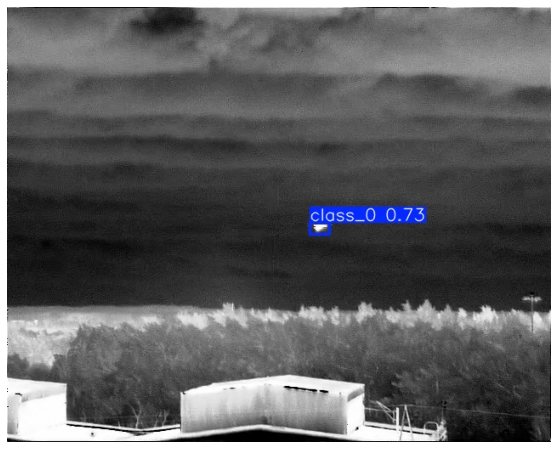

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0303.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
# check on val_set

val_image_path = os.path.join(project_path, 'baseline_dataset', 'val', 'images')

In [ ]:
val_list

['14052021_(10)@ds-0002.jpg',
 '14052021_(10)@ds-1084.jpg',
 '14052021_(11)@ds-0654.jpg',
 '14052021_(11)@ds-0880.jpg',
 '14052021_(11)@ds-1086.jpg',
 '14052021_(11)@ds-1333.jpg',
 '14052021_(9)@ds-0199.jpg',
 '14052021_(9)@ds-0403.jpg',
 '14052021_(9)@ds-0625.jpg',
 '14052021_(9)@ds-0840.jpg',
 '14052021_(9)@ds-1068.jpg',
 '14052021_(9)@ds-1274.jpg',
 '14052021_(9)@ds-1479.jpg',
 '14052021_(9)@ds-1685.jpg',
 '14052021_(9)@ds-1889.jpg',
 '14052021_(9)@ds-2096.jpg',
 '14052021_(t14)@ds-0107.jpg',
 '14052021_(t14)@ds-0311.jpg',
 '14052021_(t15)@ds-0064.jpg',
 '14052021_(t16)@ds-0181.jpg',
 '14052021_(t17)@ds-0173.jpg',
 '14052021_(t17)@ds-0375.jpg',
 '14052021_(t17)@ds-0584.jpg',
 '14052021_(t17)@ds-0824.jpg',
 '14052021_(t17)@ds-1028.jpg',
 '14052021_(t18)@ds-0202.jpg',
 '14052021_(t18)@ds-0415.jpg',
 '14052021_(t18)@ds-0620.jpg',
 '14052021_(t18)@ds-0828.jpg',
 '14052021_(t18)@ds-1033.jpg',
 '14052021_(t18)@ds-1236.jpg',
 '14052021_(t18)@ds-1439.jpg',
 '14052021_(t18)@ds-1664.jpg',
 '1

In [ ]:
def yolo_inference(path, image_name):
    res = model.predict(source = os.path.join(path, image_name),
                        show = False,
                        imgsz = 640,
                        show_labels = True,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.4,
                        max_det = 2)
    return res

In [ ]:
for img in val_list:
    res = yolo_inference(val_image_path, img)


image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(10)@ds-0002.jpg: 512x640 1 class_0, 81.8ms
Speed: 6.9ms preprocess, 81.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res2

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(10)@ds-1084.jpg: 512x640 1 class_0, 62.3ms
Speed: 10.3ms preprocess, 62.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res3

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(11)@ds-0654.jpg: 512x640 1 class_0, 20.9ms
Speed: 0.0ms preprocess, 20.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res4

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(11)@ds-0880.jpg: 512x640 1 class_0, 23.6ms
Speed: 0.0ms preprocess, 23.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res5

image 1/1 F:\DS\_1

Speed: 1.1ms preprocess, 17.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res34

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-0061.jpg: 512x640 1 class_0, 25.7ms
Speed: 0.0ms preprocess, 25.7ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res35

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-0304.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res36

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-0793.jpg: 512x640 1 class_0, 19.9ms
Speed: 2.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res37

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-1189.jpg: 512x640 1 class_0, 12.4ms
Speed: 0.0ms

Results saved to runs\detect\YOLO10_res66

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__  2@ds-0287.jpg: 512x640 1 class_0, 23.6ms
Speed: 3.2ms preprocess, 23.6ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res67

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__  2@ds-0390.jpg: 512x640 1 class_0, 9.1ms
Speed: 1.0ms preprocess, 9.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res68

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__  2@ds-0490.jpg: 512x640 1 class_0, 18.2ms
Speed: 1.6ms preprocess, 18.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res69

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__ @ds-0300.jpg: 512x640 (no detections), 9.2ms
Speed: 5.5ms preprocess, 9.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to

Speed: 3.2ms preprocess, 18.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res99


In [ ]:
len(val_list)

98

In [ ]:
debug_plane_image_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'debug')
debug_heli_image_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'debug')

debug_plane_list = os.listdir(debug_plane_image_path)
debug_heli_list = os.listdir(debug_heli_image_path)

In [ ]:
# check results
os.makedirs(os.path.join(project_path, 'res_baseline'))

In [ ]:
for i in range(2, 100, 1):
    path = os.path.join(abs_path, 'runs', 'detect')
    final_folder = 'YOLO10_res' + str(i)
    print(final_folder)
    img_name = os.listdir(os.path.join(path, final_folder))[0]
    print(img_name)
    shutil.copy2(os.path.join(path, final_folder, img_name), os.path.join(project_path, 'res_baseline'), follow_symlinks=True)

YOLO10_res2
14052021_(10)@ds-0002.jpg
YOLO10_res3
14052021_(10)@ds-1084.jpg
YOLO10_res4
14052021_(11)@ds-0654.jpg
YOLO10_res5
14052021_(11)@ds-0880.jpg
YOLO10_res6
14052021_(11)@ds-1086.jpg
YOLO10_res7
14052021_(11)@ds-1333.jpg
YOLO10_res8
14052021_(9)@ds-0199.jpg
YOLO10_res9
14052021_(9)@ds-0403.jpg
YOLO10_res10
14052021_(9)@ds-0625.jpg
YOLO10_res11
14052021_(9)@ds-0840.jpg
YOLO10_res12
14052021_(9)@ds-1068.jpg
YOLO10_res13
14052021_(9)@ds-1274.jpg
YOLO10_res14
14052021_(9)@ds-1479.jpg
YOLO10_res15
14052021_(9)@ds-1685.jpg
YOLO10_res16
14052021_(9)@ds-1889.jpg
YOLO10_res17
14052021_(9)@ds-2096.jpg
YOLO10_res18
14052021_(t14)@ds-0107.jpg
YOLO10_res19
14052021_(t14)@ds-0311.jpg
YOLO10_res20
14052021_(t15)@ds-0064.jpg
YOLO10_res21
14052021_(t16)@ds-0181.jpg
YOLO10_res22
14052021_(t17)@ds-0173.jpg
YOLO10_res23
14052021_(t17)@ds-0375.jpg
YOLO10_res24
14052021_(t17)@ds-0584.jpg
YOLO10_res25
14052021_(t17)@ds-0824.jpg
YOLO10_res26
14052021_(t17)@ds-1028.jpg
YOLO10_res27
14052021_(t18)@ds-020

C:\Users\serge\AppData\Local\Temp\ipykernel_22224\7826682.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10, 5))


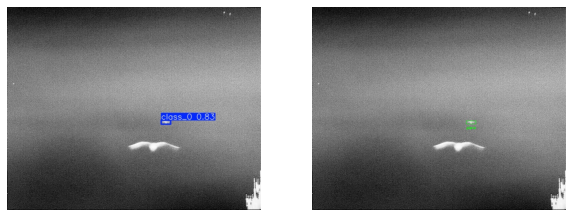

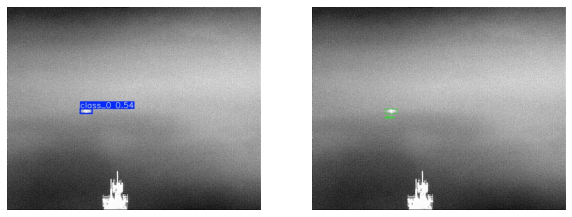

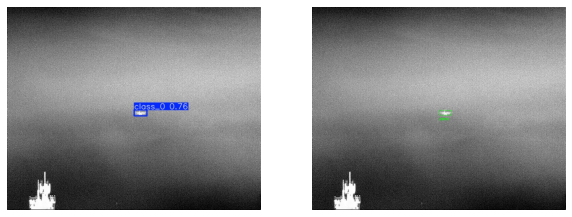

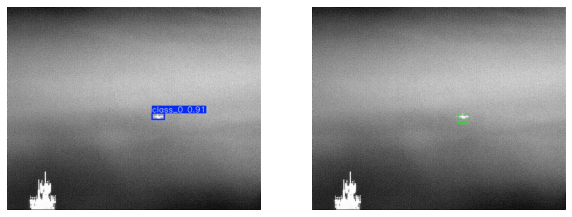

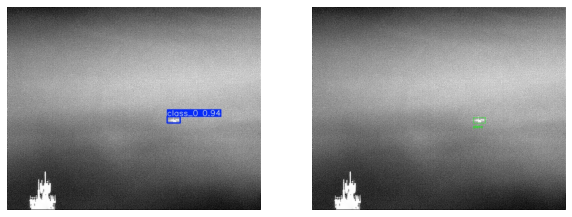

...

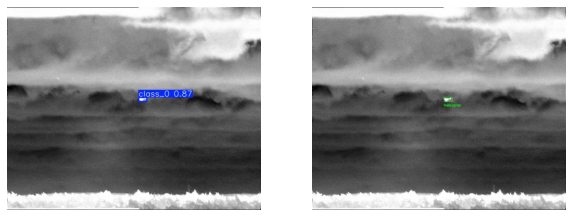

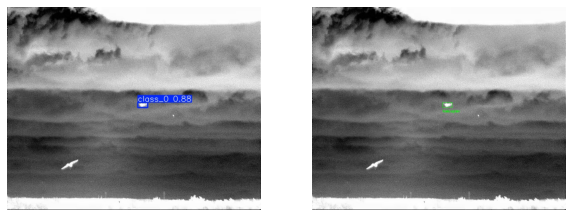

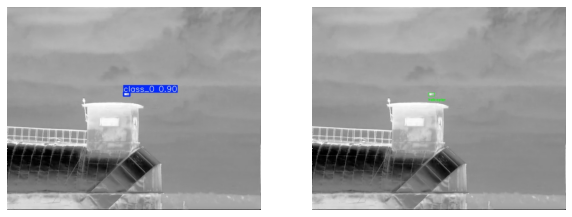

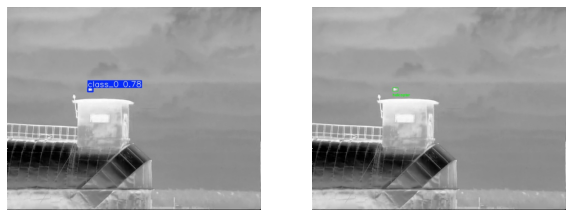

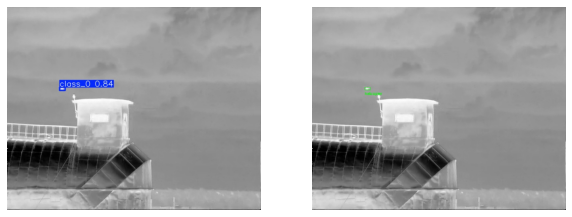

In [ ]:
for i in range(2, 100, 1):
    plt.figure(figsize = (10, 5))

    path = os.path.join(abs_path, 'runs', 'detect')
    final_folder = 'YOLO10_res' + str(i)
    img_name = os.listdir(os.path.join(path, final_folder))[0]

    plt.subplot(1, 2, 1)
    image = np.array(Image.open(os.path.join(path, final_folder, img_name)))
    plt.imshow(image)
    plt.axis('off');

    plt.subplot(1, 2, 2)
    if img_name in debug_plane_list:
        image = np.array(Image.open(os.path.join(debug_plane_image_path, img_name)))
    else:
        image = np.array(Image.open(os.path.join(debug_heli_image_path, img_name)))
    plt.imshow(image)
    plt.axis('off');

### Conclusion: yolo is good for detection, but totally failed for classiciation:(
##### We'll do 2 models: 1) detection with YOLO, 2) Classification of the detected object with other model

#### Let's check model for video

In [ ]:
class FPS_Counter:
    def __init__(self, calc_time_perion_N_frames: int) -> None:
        """Счетчик FPS по ограниченным участкам видео (скользящему окну).

        Args:
            calc_time_perion_N_frames (int): количество фреймов окна подсчета статистики.
        """
        self.time_buffer = []
        self.calc_time_perion_N_frames = calc_time_perion_N_frames

    def calc_FPS(self) -> float:
        """Производит рассчет FPS по нескольким кадрам видео.

        Returns:
            float: значение FPS.
        """
        time_buffer_is_full = len(self.time_buffer) == self.calc_time_perion_N_frames
        t = time.time()
        self.time_buffer.append(t)

        if time_buffer_is_full:
            self.time_buffer.pop(0)
            fps = len(self.time_buffer) / (self.time_buffer[-1] - self.time_buffer[0])
            return np.round(fps, 2)
        else:
            return 0.0


def calc_and_show_fps(frame, fps_counter):
    """
    Вычисляет и отображает FPS на кадре.

    Args:
        frame (numpy.ndarray): Текущий кадр изображения.
        fps_counter (FPS_Counter): Объект класса FPS_Counter для вычисления FPS.

    Returns:
        numpy.ndarray: Кадр с отображенным значением FPS.
    """
    fps_real = fps_counter.calc_FPS()
    text = f"FPS: {fps_real:.1f}"

    # Параметры для шрифтов:
    fontFace = 1
    fontScale = 1.3
    thickness = 1

    (label_width, label_height), _ = cv2.getTextSize(
        text,
        fontFace=fontFace,
        fontScale=fontScale,
        thickness=thickness,
    )
    frame = cv2.rectangle(frame, (0, 0), (10 + label_width, 15 + label_height), (0, 0, 0), -1)
    frame = cv2.putText(
        img=frame,
        text=text,
        org=(5, 20),
        fontFace=fontFace,
        fontScale=fontScale,
        thickness=thickness,
        color=(255, 255, 255),
    )
    return frame

In [ ]:
!pip install patched-yolo-infer

    torch (>=1.7.*)
           ~~~~~~^


In [ ]:
# Define the parameters
imgsz = 640
conf = 0.3

fps_counter = FPS_Counter(calc_time_perion_N_frames=10) # Определяем размер усреднения

# Инициализация
cap = cv2.VideoCapture(r"F:\DS\Хахатон_10.2024\Dataset\Dataset_video\14052021_(10).mp4")

# Проверка, успешно ли открыто видео
if not cap.isOpened():
    print("Не удалось открыть видео")
    exit()

# Получение исходного FPS и размеров кадра
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Создание объекта VideoWriter для сохранения результата
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Кодек для MP4
out = cv2.VideoWriter(os.path.join(project_path, '14052021_(10)_res.mp4'), fourcc, fps, (width, height))

while True:
    # Захват кадра
    ret, frame = cap.read()

    # Проверка, успешно ли захвачен кадр
    if not ret:
        print("Не удалось получить кадр")
        break

    frame = visualize_results_usual_yolo_inference(
        frame,
        model,
        imgsz,
        conf,
        segment=False,
        delta_colors=13,
        thickness=2,
        font_scale=0.1,
        show_boxes=True,
        show_class=False,
        show_confidences=False,
        return_image_array=True
    )

    # Ресайз
    scale = 0.5
    frame_resized = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)
    frame_resized = calc_and_show_fps(frame_resized, fps_counter)

    # Запись кадра в выходной видеофайл
    out.write(frame)

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Не удалось получить кадр


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


##### Check iou result

In [ ]:
from ultralytics import YOLO
model = YOLO(os.path.join(os.curdir, 'runs', 'detect', 'train13', 'weights', 'best.pt'))

val_image_path = os.path.join(project_path, 'baseline_dataset', 'val', 'images')
val_label_path = os.path.join(project_path, 'baseline_dataset', 'val', 'labels')
val_list = os.listdir(val_image_path)
val_label_list = os.listdir(val_label_path)

iou_list = []

img_w = 640
img_h = 512

for i in range(len(val_list)):
    name = val_list[i][:-4:]
    #print('name', name)

    # pred bboxes
    res = model.predict(source = os.path.join(val_image_path, val_list[i]),
                        show = False,
                        imgsz = 640,
                        show_labels = False,
                        save = False,
                        #name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)
    result = res[0]
    if len(res[0].boxes) > 0:
        box = result.boxes[0]
        cords = box.xyxy[0].tolist()
        pred_tensor = torch.tensor([cords], dtype=torch.float)
    else:
        pred_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)

    # real bboxes
    label_name = name + '.txt'
    if label_name in val_label_list:
        with open(os.path.join(project_path, 'baseline_dataset', 'val', 'labels', label_name), 'r') as file:
            res_test = file.read()
            res_test_list = [float(x) for x in res_test.split(' ')]

            x_min = res_test_list[1]*img_w - 0.5*(res_test_list[3]*img_w)
            y_min = res_test_list[2]*img_h - 0.5*(res_test_list[4]*img_h)
            x_max = x_min + res_test_list[3]*img_w
            y_max = y_min + res_test_list[4]*img_h

            res_test_output = [[x_min, y_min, x_max, y_max]]
            test_tensor = torch.tensor(res_test_output, dtype=torch.float)
    else:
        test_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)
    #print('test', test_tensor)


    iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
    print(bops.box_iou(pred_tensor, test_tensor))



image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(10)@ds-0002.jpg: 512x640 1 class_0, 70.5ms
Speed: 8.0ms preprocess, 70.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8594]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(10)@ds-1084.jpg: 512x640 1 class_0, 74.6ms
Speed: 0.9ms preprocess, 74.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8849]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(11)@ds-0654.jpg: 512x640 1 class_0, 71.1ms
Speed: 0.0ms preprocess, 71.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8083]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(11)@ds-0880.jpg: 512x640 1 class_0, 68.4ms
Speed: 0.0ms preprocess, 68.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8102]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(11)@ds-1086.jpg: 512x640 1 class_0, 74.7ms
S

tensor([[0.8950]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-1402.jpg: 512x640 1 class_0, 73.3ms
Speed: 0.0ms preprocess, 73.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8620]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-1613.jpg: 512x640 (no detections), 74.5ms
Speed: 0.0ms preprocess, 74.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-1830.jpg: 512x640 (no detections), 61.4ms
Speed: 0.0ms preprocess, 61.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t19)@ds-2048.jpg: 512x640 1 class_0, 72.4ms
Speed: 3.5ms preprocess, 72.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8375]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\14052021_(t20)@ds-0066.jpg:

tensor([[0.8541]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__ @ds-0909.jpg: 512x640 1 class_0, 69.0ms
Speed: 2.0ms preprocess, 69.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8037]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__ @ds-1009.jpg: 512x640 (no detections), 71.5ms
Speed: 0.6ms preprocess, 71.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__ @ds-1111.jpg: 512x640 1 class_0, 74.4ms
Speed: 0.0ms preprocess, 74.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.8551]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__ @ds-1213.jpg: 512x640 1 class_0, 75.2ms
Speed: 0.0ms preprocess, 75.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
tensor([[0.9255]])

image 1/1 F:\DS\_10.2024\baseline_dataset\val\images\27042021__ @ds-1314.jpg: 512x640 1 class_

In [ ]:
np.mean(iou_list)

0.79048723

#### Try the same with middle dataset

In [ ]:
os.makedirs(os.path.join(project_path, 'middle_dataset', 'train', 'images'))
os.makedirs(os.path.join(project_path, 'middle_dataset', 'train', 'labels'))
os.makedirs(os.path.join(project_path, 'middle_dataset', 'val', 'images'))
os.makedirs(os.path.join(project_path, 'middle_dataset', 'val', 'labels'))

In [ ]:
# проверка директории
def tree(path=(os.path.join(project_path, 'middle_dataset')), head='', tail=''):
    path = Path(path)
    if path.is_dir():
        print(head + path.name)
        entries = sorted(filter(Path.is_dir, path.iterdir()))
        for i, entry in enumerate(entries):
            if i < len(entries) - 1:
                tree(entry, tail + '├──', tail + '│  ')
            else:
                tree(entry, tail + '└──', tail + '   ')

tree()

middle_dataset
├──train
│  ├──images
│  └──labels
└──val
   ├──images
   └──labels


In [ ]:
middle_debug_plane_list = debug_plane_list[::3]
middle_debug_heli_list = debug_heli_list

print(len(middle_debug_plane_list))
print(len(middle_debug_heli_list))

5363
5489


In [ ]:
for i in range(len(middle_debug_plane_list)):
    name = middle_debug_plane_list[i][:-4:]
    img_name = name + '.jpg'
    label_name = name + '.txt'

    if img_name in plane_list:
        if i % 20 != 0:
            # копируем картинку
            shutil.copy2(os.path.join(plane_image_path, img_name), os.path.join(project_path, 'middle_dataset', 'train', 'images'), follow_symlinks=True)
            # копируем label
            shutil.copy2(os.path.join(plane_label_path, label_name), os.path.join(project_path, 'middle_dataset', 'train', 'labels'), follow_symlinks=True)
        else:
            shutil.copy2(os.path.join(plane_image_path, img_name), os.path.join(project_path, 'middle_dataset', 'val', 'images'), follow_symlinks=True)
            shutil.copy2(os.path.join(plane_label_path, label_name), os.path.join(project_path, 'middle_dataset', 'val', 'labels'), follow_symlinks=True)

In [ ]:
for i in range(len(middle_debug_heli_list)):
    name = middle_debug_heli_list[i][:-4:]
    img_name = name + '.jpg'
    label_name = name + '.txt'
    print(img_name)
    if img_name in heli_list:
        if i % 20 != 0:
            # копируем картинку
            shutil.copy2(os.path.join(heli_image_path, img_name), os.path.join(project_path, 'middle_dataset', 'train', 'images'), follow_symlinks=True)
            # копируем label
            shutil.copy2(os.path.join(heli_label_path, label_name), os.path.join(project_path, 'middle_dataset', 'train', 'labels'), follow_symlinks=True)
        else:
            shutil.copy2(os.path.join(heli_image_path, img_name), os.path.join(project_path, 'middle_dataset', 'val', 'images'), follow_symlinks=True)
            shutil.copy2(os.path.join(heli_label_path, label_name), os.path.join(project_path, 'middle_dataset', 'val', 'labels'), follow_symlinks=True)

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0001.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0002.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0003.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0004.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0005.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0006.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0007.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0008.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0009.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0010.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0011.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0012.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0013.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0014.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0015.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0016.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0017.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0018.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0019.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0020.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0021.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0022.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0023.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0024.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0025.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0026.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0027.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0028.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0241.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0242.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0243.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0244.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0245.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0246.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0247.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0248.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0249.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0250.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0251.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0252.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0253.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0254.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0255.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0256.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0257.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0258.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0259.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0260.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0261.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0262.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0263.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0264.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0265.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0266.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0267.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0268.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0479.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0480.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0481.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0482.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0483.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0484.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0485.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0486.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0487.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0488.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0489.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0490.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0491.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0492.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0493.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0494.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0495.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0496.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0497.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0498.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0499.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0500.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0501.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0502.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0503.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0504.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0505.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0506.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0721.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0722.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0723.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0724.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0725.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0726.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0727.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0728.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0729.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0730.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0731.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0732.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0733.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0735.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0736.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0737.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0738.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0739.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0740.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0741.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0742.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0743.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0744.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0745.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0746.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0747.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0748.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0749.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0960.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0961.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0962.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0963.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0964.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0965.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0966.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0967.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0968.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0969.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0970.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0971.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0972.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0973.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0974.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0975.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0976.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0977.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0978.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0979.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0980.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0981.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0982.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0983.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0984.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0985.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0986.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0987.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1200.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1201.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1202.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1203.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1204.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1205.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1206.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1207.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1208.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1209.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1210.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1211.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1212.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1214.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1215.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1216.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1217.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1218.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1219.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1220.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1221.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1222.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1223.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1224.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1225.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1226.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1227.jpg
27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-1228.jpg
27042021_¡¿¿» óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0078.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0079.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0080.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0081.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0082.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0084.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0085.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0086.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0087.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0088.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0090.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0091.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0093.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0094.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0095.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0096.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0097.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0098.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0099.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0100.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0255.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0256.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0257.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0258.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0259.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0260.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0261.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0262.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0263.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0264.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0265.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0266.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0267.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0268.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0269.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0270.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0271.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0272.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0273.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0274.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0430.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0431.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0432.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0433.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0434.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0435.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0436.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0437.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0438.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0439.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0440.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0441.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0442.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0443.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0444.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0445.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0446.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0447.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0448.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-0449.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0164.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0165.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0166.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0167.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0168.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0169.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0170.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0171.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0172.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0173.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0174.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0175.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0176.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0177.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0178.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0179.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0180.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0181.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0182.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0183.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0184.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0344.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0345.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0346.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0347.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0348.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0349.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0350.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0351.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0352.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0353.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0354.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0355.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0356.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0357.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0358.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0359.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0360.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0361.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0362.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0363.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0364.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0522.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0523.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0524.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0525.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0526.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0527.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0528.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0529.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0530.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0531.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0532.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0533.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0534.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0535.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0536.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0537.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0538.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0539.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0540.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0541.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0542.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0701.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0702.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0703.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0704.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0705.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0706.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0707.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0708.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0709.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0710.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0711.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0712.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0714.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0715.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0716.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0717.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0718.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0719.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0720.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0721.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0722.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0890.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0891.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0892.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0893.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0894.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0895.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0896.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0897.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0898.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0899.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0900.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0901.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0902.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0903.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0904.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0905.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0906.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0907.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0908.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0909.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-0910.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1067.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1068.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1069.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1070.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1071.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1072.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1073.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1074.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1075.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1076.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1077.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1078.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1079.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1080.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1081.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1082.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1083.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1084.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1085.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1086.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1087.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1249.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1250.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1251.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1252.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1253.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1254.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1255.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1256.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1257.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1258.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1259.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1260.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1261.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1262.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1263.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1264.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1265.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1266.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1267.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1268.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1269.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1428.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1429.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1430.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1431.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1432.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1433.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1434.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1435.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1436.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1437.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1438.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1439.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1440.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1441.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1442.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1443.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1444.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1446.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1447.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1449.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-1450.jpg
27042021_¡¿¿»

27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0358.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0359.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0360.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0361.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0362.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0363.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0364.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0365.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0366.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0367.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0368.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0369.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0370.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0371.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0372.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0374.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0376.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0377.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0378.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0379.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0380.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0381.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0382.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0383.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0384.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0385.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0386.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0387.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0610.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0611.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0612.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0613.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0614.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0615.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0616.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0617.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0618.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0619.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0620.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0621.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0622.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0623.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0624.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0625.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0626.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0627.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0628.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0629.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0630.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0631.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0632.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0633.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0634.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0635.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0636.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0637.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0859.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0860.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0861.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0862.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0863.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0864.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0865.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0866.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0867.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0868.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0869.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0870.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0871.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0872.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0873.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0874.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0875.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0876.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0877.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0878.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0879.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0880.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0881.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0883.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0884.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0885.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0886.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-0887.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1102.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1103.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1104.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1105.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1106.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1107.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1108.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1109.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1110.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1111.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1112.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1113.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1114.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1115.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1116.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1117.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1118.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1119.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1120.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1121.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1122.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1123.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1124.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1125.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1126.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1127.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1128.jpg
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-1129.jpg
27042021_¡¿¿»_óÑαΓ«½

27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0170.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0171.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0172.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0173.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0174.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0175.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0176.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0177.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0178.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0179.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0180.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0181.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0182.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0184.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0185.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0186.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0187.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0188.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0189.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0190.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0191.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0192.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0193.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0194.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0195.jpg


27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0394.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0395.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0397.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0398.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0399.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0400.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0401.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0402.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0403.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0404.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0405.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0406.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0407.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0408.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0409.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0410.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0411.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0412.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0413.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0414.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0415.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0416.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0417.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0418.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0419.jpg


27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0606.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0607.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0608.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0609.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0610.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0611.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0612.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0613.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0614.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0615.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0616.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0617.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0618.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0619.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0620.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0621.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0622.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0623.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0624.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0625.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0626.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0627.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0628.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0629.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0630.jpg


27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0813.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0814.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0815.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0816.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0817.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0818.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0819.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0820.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0821.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0822.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0823.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0824.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0825.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0826.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0827.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0828.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0829.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0830.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0831.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0832.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0833.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0894.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0895.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0896.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0897.jpg


27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0034.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0036.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0037.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0038.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0039.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0040.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0041.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0042.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0043.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0044.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0045.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0046.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0047.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0048.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0049.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0050.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0051.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0052.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0053.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0054.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0055.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0056.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0057.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0058.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0059.jpg


27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0257.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0258.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0259.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0260.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0261.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0262.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0263.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0264.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0265.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0266.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0267.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0268.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0269.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0270.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0271.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0272.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0273.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0274.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0275.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0276.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0277.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0278.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0279.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0280.jpg
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0281.jpg


In [ ]:
# добавим в трейн еще backgrounds
empty_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', 'backgrounds', 'images')

empty_list = os.listdir(empty_path)

for i in range(len(empty_list)):
    if i % 15 != 0:
        shutil.copy2(os.path.join(empty_path, empty_list[i]), os.path.join(project_path, 'middle_dataset', 'train', 'images'), follow_symlinks=True)
    else:
        shutil.copy2(os.path.join(empty_path, empty_list[i]), os.path.join(project_path, 'middle_dataset', 'val', 'images'), follow_symlinks=True)

In [ ]:
# проверка
print(len(os.listdir(os.path.join(project_path, 'middle_dataset', 'train', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'middle_dataset', 'train', 'labels'))))
print(len(os.listdir(os.path.join(project_path, 'middle_dataset', 'val', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'middle_dataset', 'val', 'labels'))))

9821
9620
527
512


In [ ]:
# create yaml
data = {
    'path': os.path.join(project_path, 'middle_dataset'),  # dataset root dir
    'train': os.path.join(project_path, 'middle_dataset', 'train'),  # train images
    'val': os.path.join(project_path, 'middle_dataset', 'val'),  # val images

    # Classes (1 class)
    #names: ['plane', 'helicopter']
    'nc': 2

}

with open(os.path.join(project_path, 'middle_dataset.yml'), 'w+') as file:
    yaml.dump(data, file, default_flow_style=False, sort_keys=False)

In [ ]:
# проверим, что записалось
with open(os.path.join(project_path, 'middle_dataset.yml'), 'r') as file:
    data = yaml.load(file, Loader=yaml.FullLoader)
    print(data)

{'path': 'F:\\DS\\Хахатон_10.2024\\middle_dataset', 'train': 'F:\\DS\\Хахатон_10.2024\\middle_dataset\\train', 'val': 'F:\\DS\\Хахатон_10.2024\\middle_dataset\\val', 'nc': 2}


In [ ]:
# train
from ultralytics import YOLO

baseline_model = YOLO("yolov10n.pt") # попробуем самую маленькую модель
baseline_model.info()

YOLOv10n summary: 385 layers, 2,775,520 parameters, 0 gradients, 8.7 GFLOPs


(385, 2775520, 0, 8.7404288)

In [ ]:
torch.cuda.empty_cache()
mid_results = baseline_model.train(data = os.path.join(project_path, 'middle_dataset.yml'), optimizer='Adam', lr0=0.003,
                                   device=device, epochs = 20, single_cls=True, verbose = True, amp=False,
                                   save_dir = os.path.join(project_path, 'detect'))

New https://pypi.org/project/ultralytics/8.3.10 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.87  Python-3.9.12 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov10n.pt, data=F:\DS\_10.2024\middle_dataset.yml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train17, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=N

train: Scanning F:\DS\Хахатон_10.2024\middle_dataset\train\labels.cache... 9620 images, 201 backgrounds, 0 corrupt: 100%|██████████| 9821/9821 [00:00<?, ?it/s]

train: WARNING  F:\DS\_10.2024\middle_dataset\train\images\14052021_(t16)@ds-0003.jpg: 1 duplicate labels removed
train: WARNING  F:\DS\_10.2024\middle_dataset\train\images\14052021_(t16)@ds-0006.jpg: 1 duplicate labels removed
train: WARNING  F:\DS\_10.2024\middle_dataset\train\images\14052021_(t16)@ds-0009.jpg: 1 duplicate labels removed
train: WARNING  F:\DS\_10.2024\middle_dataset\train\images\14052021_(t16)@ds-0012.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


KeyboardInterrupt: 

In [ ]:
middle_train_image_path = os.path.join(project_path, 'middle_dataset', 'train', 'images')
middle_train_label_path = os.path.join(project_path, 'middle_dataset', 'train', 'labels')

middle_val_image_path = os.path.join(project_path, 'middle_dataset', 'val', 'images')
middle_val_label_path = os.path.join(project_path, 'middle_dataset', 'val', 'labels')

In [ ]:
middle_train_label_list = os.listdir(os.path.join(project_path, 'middle_dataset', 'train', 'labels'))
middle_val_label_list = os.listdir(os.path.join(project_path, 'middle_dataset', 'val', 'labels'))

In [ ]:
val_list = os.listdir(middle_val_image_path)
val_list

['14052021_(1)@ds-0031-aughor-inv.jpg',
 '14052021_(1)@ds-0150.jpg',
 '14052021_(10)@ds-0002.jpg',
 '14052021_(10)@ds-0079.jpg',
 '14052021_(10)@ds-0981.jpg',
 '14052021_(10)@ds-1062.jpg',
 '14052021_(10)@ds-1131.jpg',
 '14052021_(10)@ds-1202.jpg',
 '14052021_(11)@ds-0051.jpg',
 '14052021_(11)@ds-0681.jpg',
 '14052021_(11)@ds-0751.jpg',
 '14052021_(11)@ds-0818.jpg',
 '14052021_(11)@ds-0880.jpg',
 '14052021_(11)@ds-0941.jpg',
 '14052021_(11)@ds-1003.jpg',
 '14052021_(11)@ds-1066.jpg',
 '14052021_(11)@ds-1132.jpg',
 '14052021_(11)@ds-1202.jpg',
 '14052021_(11)@ds-1293.jpg',
 '14052021_(13)@ds-0001-inv.jpg',
 '14052021_(13)@ds-0156-aughor.jpg',
 '14052021_(13)@ds-0500-aughor-inv.jpg',
 '14052021_(13)@ds-0956.jpg',
 '14052021_(13)@ds-1280-inv.jpg',
 '14052021_(14)@ds-0142-aughor.jpg',
 '14052021_(9)@ds-0015.jpg',
 '14052021_(9)@ds-0078.jpg',
 '14052021_(9)@ds-0139.jpg',
 '14052021_(9)@ds-0199.jpg',
 '14052021_(9)@ds-0259.jpg',
 '14052021_(9)@ds-0320.jpg',
 '14052021_(9)@ds-0382.jpg',
 '140

In [ ]:
# valinference
from ultralytics import YOLO
model = YOLO(os.path.join(os.curdir, 'runs', 'detect', 'train16', 'weights', 'best.pt'))

In [ ]:
def yolo_inference(path, image_name):
    res = model.predict(source = os.path.join(path, image_name),
                        show = False,
                        imgsz = 640,
                        show_labels = True,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.4,
                        max_det = 2)

    result = res[0]
    if len(res[0].boxes) > 0:
        box = result.boxes[0]
        cords = box.xyxy[0].tolist()
        pred_tensor = torch.tensor([cords], dtype=torch.float)
    else:
        pred_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)

    return res, pred_tensor

In [ ]:
import time

# начальное время
start_time = time.time()

iou_list = []

img_w = 640
img_h = 512

for i in range(len(val_list)):
    name = val_list[i][:-4:]
    res, pred_tensor = yolo_inference(middle_val_image_path, val_list[i])

    label_name = name + '.txt'
    if label_name in middle_val_label_list:
        with open(os.path.join(middle_val_label_path, label_name), 'r') as file:
            res_test = file.read()
            res_test_list = [float(x) for x in res_test.split(' ')]

            x_min = res_test_list[1]*img_w - 0.5*(res_test_list[3]*img_w)
            y_min = res_test_list[2]*img_h - 0.5*(res_test_list[4]*img_h)
            x_max = x_min + res_test_list[3]*img_w
            y_max = y_min + res_test_list[4]*img_h

            res_test_output = [[x_min, y_min, x_max, y_max]]
            test_tensor = torch.tensor(res_test_output, dtype=torch.float)
    else:
        test_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)

    iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
# конечное время
end_time = time.time()

# разница между конечным и начальным временем
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(1)@ds-0031-aughor-inv.jpg: 512x640 (no detections), 83.5ms
Speed: 6.0ms preprocess, 83.5ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res101

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(1)@ds-0150.jpg: 512x640 (no detections), 81.7ms
Speed: 0.0ms preprocess, 81.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res102

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(10)@ds-0002.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res103

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(10)@ds-0079.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res104

Speed: 1.0ms preprocess, 16.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res133

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-0506.jpg: 512x640 1 class_0, 19.8ms
Speed: 1.0ms preprocess, 19.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res134

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-0571.jpg: 512x640 1 class_0, 16.7ms
Speed: 9.9ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res135

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-0647.jpg: 512x640 1 class_0, 18.0ms
Speed: 0.0ms preprocess, 18.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res136

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-0708.jpg: 512x640 1 class_0, 13.9ms
Speed: 1.0ms preprocess,

Results saved to runs\detect\YOLO10_res165

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t14)@ds-0148.jpg: 512x640 1 class_0, 16.7ms
Speed: 8.9ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res166

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t14)@ds-0210.jpg: 512x640 1 class_0, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 9.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res167

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t14)@ds-0271.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res168

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t14)@ds-0331.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 8.7ms postprocess per image at shape (1, 3, 512, 640)
Results saved to

Speed: 1.0ms preprocess, 14.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res198

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t18)@ds-0436.jpg: 512x640 1 class_0, 19.4ms
Speed: 2.0ms preprocess, 19.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res199

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t18)@ds-0498.jpg: 512x640 1 class_0, 14.7ms
Speed: 2.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res200

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t18)@ds-0559.jpg: 512x640 1 class_0, 18.3ms
Speed: 1.5ms preprocess, 18.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res201

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t18)@ds-0620.jpg: 512x640 1 class_0, 7.0ms
Speed: 11.1ms pre

Results saved to runs\detect\YOLO10_res230

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-1317.jpg: 512x640 (no detections), 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res231

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-1382.jpg: 512x640 1 class_0, 17.3ms
Speed: 14.4ms preprocess, 17.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res232

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-1445.jpg: 512x640 1 class_0, 18.7ms
Speed: 2.0ms preprocess, 18.7ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res233

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-1509.jpg: 512x640 (no detections), 17.6ms
Speed: 0.5ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Res


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t20)@ds-1485.jpg: 512x640 (no detections), 14.6ms
Speed: 2.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res263

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t20)@ds-1555.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res264

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t21)@ds-0007.jpg: 512x640 1 class_0, 19.5ms
Speed: 1.0ms preprocess, 19.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res265

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t21)@ds-0069.jpg: 512x640 1 class_0, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res266

image 1/1

Speed: 11.1ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res295

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0039.jpg: 512x640 1 class_0, 28.3ms
Speed: 0.0ms preprocess, 28.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res296

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0101.jpg: 512x640 1 class_0, 26.3ms
Speed: 3.0ms preprocess, 26.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res297

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0163.jpg: 512x640 (no detections), 16.5ms
Speed: 2.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res298

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0223.jpg: 512x640 1 class_0, 33.2ms
Speed: 0.

Results saved to runs\detect\YOLO10_res327

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-2058.jpg: 512x640 1 class_0, 17.5ms
Speed: 6.5ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res328

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-2118.jpg: 512x640 2 class_0s, 17.6ms
Speed: 1.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res329

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-2182.jpg: 512x640 1 class_0, 16.7ms
Speed: 1.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res330

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t37)@ds-0048.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved t


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_00  @ds-0499.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res360

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_00  @ds-0560.jpg: 512x640 1 class_0, 20.1ms
Speed: 0.0ms preprocess, 20.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res361

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_00  @ds-0622.jpg: 512x640 1 class_0, 16.4ms
Speed: 13.9ms preprocess, 16.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res362

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_00  @ds-0682.jpg: 512x640 1 class_0, 24.6ms
Speed: 2.0ms preprocess, 24.6ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res363

im

Results saved to runs\detect\YOLO10_res392

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0503.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res393

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0524.jpg: 512x640 1 class_0, 25.8ms
Speed: 0.0ms preprocess, 25.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res394

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0544.jpg: 512x640 (no detections), 19.9ms
Speed: 0.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res395

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0564.jpg: 512x640 1 class_0, 19.3ms
Speed: 0.0ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\dete

Results saved to runs\detect\YOLO10_res425

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1170.jpg: 512x640 1 class_0, 27.3ms
Speed: 2.0ms preprocess, 27.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res426

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1190.jpg: 512x640 1 class_0, 28.3ms
Speed: 2.3ms preprocess, 28.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res427

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1210.jpg: 512x640 1 class_0, 30.8ms
Speed: 0.0ms preprocess, 30.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res428

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1231.jpg: 512x640 1 class_0, 32.4ms
Speed: 0.0ms preprocess, 32.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOL

Speed: 0.0ms preprocess, 29.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res458

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0073.jpg: 512x640 (no detections), 27.9ms
Speed: 0.0ms preprocess, 27.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res459

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0238.jpg: 512x640 1 class_0, 25.7ms
Speed: 2.0ms preprocess, 25.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res460

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0280.jpg: 512x640 1 class_0, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res461

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0300.jpg: 512x640 1 class_0, 13.0ms
Speed: 12.5ms preproce

Speed: 2.0ms preprocess, 13.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res491

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0909.jpg: 512x640 1 class_0, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res492

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0929.jpg: 512x640 1 class_0, 15.2ms
Speed: 1.0ms preprocess, 15.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res493

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0949.jpg: 512x640 1 class_0, 17.7ms
Speed: 2.0ms preprocess, 17.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res494

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0969.jpg: 512x640 1 class_0, 19.4ms
Speed: 0.9ms preprocess, 19.

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-0332.jpg: 512x640 1 class_0, 26.5ms
Speed: 3.0ms preprocess, 26.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res524

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-0352.jpg: 512x640 1 class_0, 27.6ms
Speed: 3.0ms preprocess, 27.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res525

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-0374.jpg: 512x640 1 class_0, 27.3ms
Speed: 2.0ms preprocess, 27.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res526

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-0395.jpg: 512x640 1 class_0, 27.5ms
Speed: 3.0ms preprocess, 27.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res527

image 1/1 F:\DS\_10.2024\middle_

Results saved to runs\detect\YOLO10_res556

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0011.jpg: 512x640 1 class_0, 26.6ms
Speed: 2.0ms preprocess, 26.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res557

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0072.jpg: 512x640 1 class_0, 26.2ms
Speed: 2.0ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res558

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0092.jpg: 512x640 1 class_0, 26.3ms
Speed: 3.0ms preprocess, 26.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res559

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0112.jpg: 512x640 1 class_0, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Results save


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0711.jpg: 512x640 1 class_0, 26.2ms
Speed: 3.0ms preprocess, 26.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res589

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0731.jpg: 512x640 1 class_0, 26.3ms
Speed: 3.0ms preprocess, 26.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res590

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0751.jpg: 512x640 1 class_0, 26.9ms
Speed: 2.0ms preprocess, 26.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res591

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0771.jpg: 512x640 1 class_0, 26.7ms
Speed: 2.0ms preprocess, 26.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res592

image 1/1 F

Speed: 2.9ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res621

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\  1 @ds-0158.jpg: 512x640 1 class_0, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res622

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\  1 @ds-0254.jpg: 512x640 (no detections), 26.7ms
Speed: 3.0ms preprocess, 26.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res623

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\  1 @ds-0319.jpg: 512x640 1 class_0, 26.2ms
Speed: 2.0ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res624

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\  1 @ds-0381.jpg: 512x640 (no detections), 26.7ms
Speed: 2.0ms preprocess, 26.7ms inference, 0

In [ ]:
iou_list

[array([[        nan]], dtype=float32),
 array([[        nan]], dtype=float32),
 array([[    0.75981]], dtype=float32),
 array([[    0.84414]], dtype=float32),
 array([[    0.92145]], dtype=float32),
 array([[    0.87146]], dtype=float32),
 array([[    0.91581]], dtype=float32),
 array([[    0.89563]], dtype=float32),
 array([[    0.86491]], dtype=float32),
 array([[    0.89206]], dtype=float32),
 array([[    0.90362]], dtype=float32),
 array([[    0.90062]], dtype=float32),
 array([[    0.85362]], dtype=float32),
 array([[    0.84876]], dtype=float32),
 array([[    0.86057]], dtype=float32),
 array([[     0.9109]], dtype=float32),
 array([[    0.82053]], dtype=float32),
 array([[    0.88634]], dtype=float32),
 array([[    0.67825]], dtype=float32),
 array([[        nan]], dtype=float32),
 array([[        nan]], dtype=float32),
 array([[        nan]], dtype=float32),
 array([[        nan]], dtype=float32),
 array([[        nan]], dtype=float32),
 array([[        nan]], dtype=float32),


In [ ]:
np.nanmean(iou_list)

0.8333479

In [ ]:
# try to inference it faster
def yolo_fast_inference(path, image_name, conf, max_det):
    res = model.predict(source = os.path.join(path, image_name),
                        show = False,
                        imgsz = 640,
                        show_labels = True,
                        save = False,
                        #name = "YOLO10_res",
                        conf = conf,
                        max_det = max_det)

    result = res[0]
    if len(res[0].boxes) > 0:
        box = result.boxes[0]
        cords = box.xyxy[0].tolist()
        pred_tensor = torch.tensor([cords], dtype=torch.float)
    else:
        pred_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)
        cords = [0, 0, 0, 0]

    return res, pred_tensor, cords

In [ ]:
# начальное время
start_time = time.time()

iou_list = []

img_w = 640
img_h = 512

for i in range(len(val_list)):
    name = val_list[i][:-4:]
    res, pred_tensor = yolo_fast_inference(middle_val_image_path, val_list[i], 0.3, 2)

    label_name = name + '.txt'
    if label_name in middle_val_label_list:
        with open(os.path.join(middle_val_label_path, label_name), 'r') as file:
            res_test = file.read()
            res_test_list = [float(x) for x in res_test.split(' ')]

            x_min = res_test_list[1]*img_w - 0.5*(res_test_list[3]*img_w)
            y_min = res_test_list[2]*img_h - 0.5*(res_test_list[4]*img_h)
            x_max = x_min + res_test_list[3]*img_w
            y_max = y_min + res_test_list[4]*img_h

            res_test_output = [[x_min, y_min, x_max, y_max]]
            test_tensor = torch.tensor(res_test_output, dtype=torch.float)
    else:
        test_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)
        #print('test', test_tensor)


    iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
# конечное время
end_time = time.time()

# разница между конечным и начальным временем
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(1)@ds-0031-aughor-inv.jpg: 512x640 (no detections), 84.8ms
Speed: 5.0ms preprocess, 84.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(1)@ds-0150.jpg: 512x640 (no detections), 75.5ms
Speed: 4.8ms preprocess, 75.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(10)@ds-0002.jpg: 512x640 1 class_0, 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(10)@ds-0079.jpg: 512x640 1 class_0, 25.3ms
Speed: 0.0ms preprocess, 25.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(10)@ds-0981.jpg: 512x640 1 class_0, 23.9ms
Speed: 0.0ms preprocess, 23.9ms inference, 0.0ms postprocess per i

Speed: 0.0ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-1047.jpg: 512x640 1 class_0, 17.0ms
Speed: 14.7ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-1108.jpg: 512x640 1 class_0, 18.3ms
Speed: 15.6ms preprocess, 18.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-1171.jpg: 512x640 2 class_0s, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-1233.jpg: 512x640 1 class_0, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(9)@ds-1294.jpg: 512x640 1 class_0,


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t17)@ds-0375.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t17)@ds-0436.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.3ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t17)@ds-0500.jpg: 512x640 1 class_0, 26.7ms
Speed: 2.0ms preprocess, 26.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t17)@ds-0563.jpg: 512x640 1 class_0, 18.4ms
Speed: 1.0ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t17)@ds-0625.jpg: 512x640 1 class_0, 16.7ms
Speed: 2.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1

Speed: 1.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-0130.jpg: 512x640 1 class_0, 19.1ms
Speed: 0.0ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-0345.jpg: 512x640 1 class_0, 15.9ms
Speed: 1.0ms preprocess, 15.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-0753.jpg: 512x640 1 class_0, 28.5ms
Speed: 0.0ms preprocess, 28.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-0814.jpg: 512x640 1 class_0, 23.1ms
Speed: 0.0ms preprocess, 23.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t19)@ds-0877.jpg: 512x640 1 c


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t20)@ds-1485.jpg: 512x640 (no detections), 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t20)@ds-1555.jpg: 512x640 1 class_0, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t21)@ds-0007.jpg: 512x640 1 class_0, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t21)@ds-0069.jpg: 512x640 1 class_0, 19.2ms
Speed: 0.0ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t21)@ds-0131.jpg: 512x640 1 class_0, 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at sh

Speed: 1.0ms preprocess, 2.0ms inference, 13.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0548.jpg: 512x640 (no detections), 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0617.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0677.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0740.jpg: 512x640 1 class_0, 15.8ms
Speed: 15.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t36)@ds-0805.jpg: 512x


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t4)@ds-0577.jpg: 512x640 1 class_0, 18.5ms
Speed: 0.0ms preprocess, 18.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t4)@ds-0640.jpg: 512x640 1 class_0, 19.7ms
Speed: 2.0ms preprocess, 19.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t4)@ds-0703.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t4)@ds-0780.jpg: 512x640 1 class_0, 19.2ms
Speed: 0.0ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\14052021_(t4)@ds-0840.jpg: 512x640 1 class_0, 24.6ms
Speed: 2.0ms preprocess, 24.6ms inference, 1.0ms postprocess per image at shape (1, 3, 

Speed: 12.4ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0343.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0363.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0383.jpg: 512x640 1 class_0, 12.1ms
Speed: 0.0ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0403.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.3ms preprocess, 15.6ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-0423.jpg: 512x640 1 class_0, 22.4ms
Spee


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1170.jpg: 512x640 1 class_0, 38.7ms
Speed: 0.0ms preprocess, 38.7ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1190.jpg: 512x640 1 class_0, 18.6ms
Speed: 1.0ms preprocess, 18.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1210.jpg: 512x640 1 class_0, 13.3ms
Speed: 1.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1231.jpg: 512x640 1 class_0, 15.7ms
Speed: 10.8ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ @ds-1415.jpg: 512x640 1 class_0, 13.1ms
Speed: 1.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

ima


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0400.jpg: 512x640 1 class_0, 16.8ms
Speed: 1.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0421.jpg: 512x640 1 class_0, 12.0ms
Speed: 2.0ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0441.jpg: 512x640 1 class_0, 15.2ms
Speed: 1.0ms preprocess, 15.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0461.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-0481.jpg: 512x640 1 class_0, 15.1ms
Speed: 2.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)



image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-1233.jpg: 512x640 1 class_0, 18.5ms
Speed: 0.0ms preprocess, 18.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-1254.jpg: 512x640 1 class_0, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-1274.jpg: 512x640 2 class_0s, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-1294.jpg: 512x640 1 class_0, 5.0ms
Speed: 7.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__ @ds-1314.jpg: 512x640 1 class_0, 18.9ms
Speed: 0.0ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

im

Speed: 1.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-1023.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-1043.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-1063.jpg: 512x640 1 class_0, 17.0ms
Speed: 16.3ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-1084.jpg: 512x640 1 class_0, 13.9ms
Speed: 0.0ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021__@ds-1104.jpg: 512x640 1 class_0, 19.1ms
Spee


image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0731.jpg: 512x640 1 class_0, 15.1ms
Speed: 1.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0751.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0771.jpg: 512x640 1 class_0, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0791.jpg: 512x640 1 class_0, 16.9ms
Speed: 2.0ms preprocess, 16.9ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\middle_dataset\val\images\27042021_ 12_30@ds-0811.jpg: 512x640 2 class_0s, 18.8ms
Speed: 1.0ms preprocess, 18.8ms inference, 1.0ms postprocess per image at sh

In [ ]:
np.nanmean(iou_list)

0.8435818

##### Check on videos

In [ ]:
# Define the parameters
imgsz = 640
conf = 0.3

fps_counter = FPS_Counter(calc_time_perion_N_frames=10) # Определяем размер усреднения

# Инициализация
cap = cv2.VideoCapture(r"F:\DS\Хахатон_10.2024\Dataset\Dataset_video\14052021_(10).mp4")

# Проверка, успешно ли открыто видео
if not cap.isOpened():
    print("Не удалось открыть видео")
    exit()

# Получение исходного FPS и размеров кадра
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Создание объекта VideoWriter для сохранения результата
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Кодек для MP4
out = cv2.VideoWriter(os.path.join(project_path, '14052021_(10)_res_middle.mp4'), fourcc, fps, (width, height))

while True:
    # Захват кадра
    ret, frame = cap.read()

    # Проверка, успешно ли захвачен кадр
    if not ret:
        print("Не удалось получить кадр")
        break

    frame = visualize_results_usual_yolo_inference(
        frame,
        model,
        imgsz,
        conf,
        segment=False,
        delta_colors=13,
        thickness=2,
        font_scale=0.1,
        show_boxes=True,
        show_class=False,
        show_confidences=False,
        return_image_array=True
    )

    # Ресайз
    scale = 0.5
    frame_resized = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)
    frame_resized = calc_and_show_fps(frame_resized, fps_counter)

    # Запись кадра в выходной видеофайл
    out.write(frame)

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Не удалось получить кадр


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [ ]:
# Define the parameters
imgsz = 640
conf = 0.3

fps_counter = FPS_Counter(calc_time_perion_N_frames=10) # Определяем размер усреднения

# Инициализация
cap = cv2.VideoCapture(r"F:\DS\Хахатон_10.2024\Dataset\Dataset_video\14052021_(t36).mp4")

# Проверка, успешно ли открыто видео
if not cap.isOpened():
    print("Не удалось открыть видео")
    exit()

# Получение исходного FPS и размеров кадра
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Создание объекта VideoWriter для сохранения результата
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Кодек для MP4
out = cv2.VideoWriter(os.path.join(project_path, '14052021_(t36)_res_middle.mp4'), fourcc, fps, (width, height))

while True:
    # Захват кадра
    ret, frame = cap.read()

    # Проверка, успешно ли захвачен кадр
    if not ret:
        print("Не удалось получить кадр")
        break

    frame = visualize_results_usual_yolo_inference(
        frame,
        model,
        imgsz,
        conf,
        segment=False,
        delta_colors=13,
        thickness=2,
        font_scale=0.1,
        show_boxes=True,
        show_class=False,
        show_confidences=False,
        return_image_array=True
    )

    # Ресайз
    scale = 0.5
    frame_resized = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)
    frame_resized = calc_and_show_fps(frame_resized, fps_counter)

    # Запись кадра в выходной видеофайл
    out.write(frame)

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Не удалось получить кадр


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


##### IOU score

In [ ]:
def iou_calc(img_path, img_name, conf, max_det):
    res, pred_tensor, cords = yolo_fast_inference(img_path, img_name, conf, max_det)

    return pred_tensor, cords

In [ ]:
def label_recalc(label_list, label_path, label_name):
    if label_name in label_list:
        with open(os.path.join(label_path, label_name), 'r') as file:
            res_test = file.read()
            res_test_list = [float(x) for x in res_test.split(' ')]

            x_min = res_test_list[1]*img_w - 0.5*(res_test_list[3]*img_w)
            y_min = res_test_list[2]*img_h - 0.5*(res_test_list[4]*img_h)
            x_max = x_min + res_test_list[3]*img_w
            y_max = y_min + res_test_list[4]*img_h

            res_test_output = [[x_min, y_min, x_max, y_max]]
            test_tensor = torch.tensor(res_test_output, dtype=torch.float)
    else:
        test_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float)

    return test_tensor

In [ ]:
#val_list = os.listdir(middle_val_image_path)
val_list

['14052021_(1)@ds-0031-aughor-inv.jpg',
 '14052021_(1)@ds-0150.jpg',
 '14052021_(10)@ds-0002.jpg',
 '14052021_(10)@ds-0079.jpg',
 '14052021_(10)@ds-0981.jpg',
 '14052021_(10)@ds-1062.jpg',
 '14052021_(10)@ds-1131.jpg',
 '14052021_(10)@ds-1202.jpg',
 '14052021_(11)@ds-0051.jpg',
 '14052021_(11)@ds-0681.jpg',
 '14052021_(11)@ds-0751.jpg',
 '14052021_(11)@ds-0818.jpg',
 '14052021_(11)@ds-0880.jpg',
 '14052021_(11)@ds-0941.jpg',
 '14052021_(11)@ds-1003.jpg',
 '14052021_(11)@ds-1066.jpg',
 '14052021_(11)@ds-1132.jpg',
 '14052021_(11)@ds-1202.jpg',
 '14052021_(11)@ds-1293.jpg',
 '14052021_(13)@ds-0001-inv.jpg',
 '14052021_(13)@ds-0156-aughor.jpg',
 '14052021_(13)@ds-0500-aughor-inv.jpg',
 '14052021_(13)@ds-0956.jpg',
 '14052021_(13)@ds-1280-inv.jpg',
 '14052021_(14)@ds-0142-aughor.jpg',
 '14052021_(9)@ds-0015.jpg',
 '14052021_(9)@ds-0078.jpg',
 '14052021_(9)@ds-0139.jpg',
 '14052021_(9)@ds-0199.jpg',
 '14052021_(9)@ds-0259.jpg',
 '14052021_(9)@ds-0320.jpg',
 '14052021_(9)@ds-0382.jpg',
 '140

In [ ]:
back_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', 'backgrounds', 'images')
back_listdir = os.listdir(back_img_path)

plane_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'images')
heli_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'images')

plane_listdir = os.listdir(plane_img_path)
heli_listdir = os.listdir(heli_img_path)

plane_label_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'labels')
heli_label_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'labels')

plane_label_listdir = os.listdir(plane_label_path)
heli_label_listdir = os.listdir(heli_label_path)

In [ ]:
back_listdir

['14052021_(1)@ds-0031-aughor-inv.jpg',
 '14052021_(1)@ds-0031-aughor.jpg',
 '14052021_(1)@ds-0031-inv.jpg',
 '14052021_(1)@ds-0031.jpg',
 '14052021_(1)@ds-0081-aughor-inv.jpg',
 '14052021_(1)@ds-0081-aughor.jpg',
 '14052021_(1)@ds-0081-inv.jpg',
 '14052021_(1)@ds-0081.jpg',
 '14052021_(1)@ds-0130-aughor-inv.jpg',
 '14052021_(1)@ds-0130-aughor.jpg',
 '14052021_(1)@ds-0130-inv.jpg',
 '14052021_(1)@ds-0130.jpg',
 '14052021_(1)@ds-0150-aughor-inv.jpg',
 '14052021_(1)@ds-0150-aughor.jpg',
 '14052021_(1)@ds-0150-inv.jpg',
 '14052021_(1)@ds-0150.jpg',
 '14052021_(1)@ds-0166-aughor-inv.jpg',
 '14052021_(1)@ds-0166-aughor.jpg',
 '14052021_(1)@ds-0166-inv.jpg',
 '14052021_(1)@ds-0166.jpg',
 '14052021_(1)@ds-0177-aughor-inv.jpg',
 '14052021_(1)@ds-0177-aughor.jpg',
 '14052021_(1)@ds-0177-inv.jpg',
 '14052021_(1)@ds-0177.jpg',
 '14052021_(1)@ds-0272-aughor-inv.jpg',
 '14052021_(1)@ds-0272-aughor.jpg',
 '14052021_(1)@ds-0272-inv.jpg',
 '14052021_(1)@ds-0272.jpg',
 '14052021_(13)@ds-0001-aughor-inv

In [ ]:
# начальное время
start_time = time.time()
print('Starting...')

name_list = []
coord_list = []
iou_list = []

img_w = 640
img_h = 512

conf = 0.3
max_det = 2

for i in range(len(val_list)):
    name_base = re.sub(r'(?<=@ds-[\d]{4})[\d\w\-]*\.jpg', '', val_list[i])

    if val_list[i] in back_listdir:
        name_list.append(val_list[i])
        coord_list.append([0, 0, 0, 0])
        iou_list.append([[np.array(0.0)]])
    else:
        simple_name = name_base + '.jpg'
        inv_name = name_base + '-inv' + '.jpg'
        aughor_name = name_base + '-aughor' + '.jpg'
        aughor_inv_name = name_base + '-aughor-inv' + '.jpg'

        simple_label = name_base + '.txt'
        inv_label = name_base + '-inv' + '.txt'
        aughor_label = name_base + '-aughor' + '.txt'
        aughor_inv_label = name_base + '-aughor-inv' + '.txt'

        if val_list[i] in plane_listdir:
            img_path = plane_img_path
            label_path = plane_label_path
            label_list = plane_label_listdir
        else:
            img_path = heli_img_path
            label_path = heli_label_path
            label_list = heli_label_listdir

        # common
        pred_tensor, cords = iou_calc(img_path, simple_name, conf, max_det)
        test_tensor = label_recalc(label_list, label_path, simple_label)

        name_list.append(simple_name)
        iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
        coord_list.append(cords)

        # inv
        pred_tensor, cords = iou_calc(img_path, inv_name, conf, max_det)
        test_tensor = label_recalc(label_list, label_path, inv_label)

        name_list.append(inv_name)
        iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
        coord_list.append(cords)

        # aughor
        pred_tensor, cords = iou_calc(img_path, aughor_name, conf, max_det)
        test_tensor = label_recalc(label_list, label_path, aughor_label)

        name_list.append(simple_name)
        iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
        coord_list.append(cords)

        # aughor_inv
        pred_tensor, cords = iou_calc(img_path, aughor_inv_name, conf, max_det)
        test_tensor = label_recalc(label_list, label_path, aughor_inv_label)

        name_list.append(aughor_inv_name)
        iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())
        coord_list.append(cords)


# конечное время
end_time = time.time()

# разница между конечным и начальным временем
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)

Starting...
Elapsed time:  44.9140260219574


In [ ]:
iou_list

[[[array(          0)]],
 [[array(          0)]],
 array([[    0.75981]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.77285]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.84414]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.83842]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.92145]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.90213]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.87146]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.83721]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.91581]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.91593]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.89563]], dtype=float32),
 array([[          0]], dtype=float32),
 array([[    0.90363]], dtype=float32),
 array([[          0]], dtype=

In [ ]:
np.nanmean(iou_list)

0.427546174966532

In [ ]:
# look at results

res_tab = pd.DataFrame(columns = ['name', 'iou', 'coords'])
res_tab['name'] = name_list
res_tab['iou'] = iou_list
res_tab['coords'] = coord_list


res_tab

,name,iou,coords
0,14052021_(1)@ds-0031-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]"
1,14052021_(1)@ds-0150.jpg,[[0.0]],"[0, 0, 0, 0]"
2,14052021_(10)@ds-0002.jpg,[[0.75981015]],"[389.7070007324219, 284.5755615234375, 412.253..."
3,14052021_(10)@ds-0002-inv.jpg,[[0.0]],"[0, 0, 0, 0]"
4,14052021_(10)@ds-0002.jpg,[[0.7728533]],"[227.15841674804688, 284.9590148925781, 250.07..."
...,...,...,...
2058,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0444-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]"
2059,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.92667246]],"[239.61334228515625, 232.91781616210938, 250.1..."
2060,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507-inv.jpg,[[0.0]],"[0, 0, 0, 0]"
2061,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.87049663]],"[389.4095764160156, 232.7520294189453, 400.175..."


In [ ]:
res_tab['iou_int'] = ''
for i in range(len(res_tab)):
    res_tab['iou_int'][i] = res_tab['iou'][i][0][0]

res_tab

,name,iou,coords,iou_int
0,14052021_(1)@ds-0031-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0
1,14052021_(1)@ds-0150.jpg,[[0.0]],"[0, 0, 0, 0]",0.0
2,14052021_(10)@ds-0002.jpg,[[0.75981015]],"[389.7070007324219, 284.5755615234375, 412.253...",0.75981
3,14052021_(10)@ds-0002-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0
4,14052021_(10)@ds-0002.jpg,[[0.7728533]],"[227.15841674804688, 284.9590148925781, 250.07...",0.772853
...,...,...,...,...
2058,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0444-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0
2059,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.92667246]],"[239.61334228515625, 232.91781616210938, 250.1...",0.926672
2060,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0
2061,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.87049663]],"[389.4095764160156, 232.7520294189453, 400.175...",0.870497


In [ ]:
res_tab['back'] = ''
for i in range(len(res_tab)):
    if res_tab['name'][i] in back_listdir:
        res_tab['back'][i] = 1
    else:
        res_tab['back'][i] = 0

res_tab

,name,iou,coords,iou_int,back
0,14052021_(1)@ds-0031-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,1
1,14052021_(1)@ds-0150.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,1
2,14052021_(10)@ds-0002.jpg,[[0.75981015]],"[389.7070007324219, 284.5755615234375, 412.253...",0.75981,0
3,14052021_(10)@ds-0002-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
4,14052021_(10)@ds-0002.jpg,[[0.7728533]],"[227.15841674804688, 284.9590148925781, 250.07...",0.772853,0
...,...,...,...,...,...
2058,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0444-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
2059,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.92667246]],"[239.61334228515625, 232.91781616210938, 250.1...",0.926672,0
2060,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
2061,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.87049663]],"[389.4095764160156, 232.7520294189453, 400.175...",0.870497,0


In [ ]:
res_tab_objects = res_tab[res_tab['back'] == 0]
res_tab_objects

,name,iou,coords,iou_int,back
2,14052021_(10)@ds-0002.jpg,[[0.75981015]],"[389.7070007324219, 284.5755615234375, 412.253...",0.75981,0
3,14052021_(10)@ds-0002-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
4,14052021_(10)@ds-0002.jpg,[[0.7728533]],"[227.15841674804688, 284.9590148925781, 250.07...",0.772853,0
5,14052021_(10)@ds-0002-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
6,14052021_(10)@ds-0079.jpg,[[0.84414476]],"[397.8175964355469, 281.36859130859375, 422.07...",0.844145,0
...,...,...,...,...,...
2058,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0444-aughor-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
2059,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.92667246]],"[239.61334228515625, 232.91781616210938, 250.1...",0.926672,0
2060,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507-inv.jpg,[[0.0]],"[0, 0, 0, 0]",0.0,0
2061,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0507.jpg,[[0.87049663]],"[389.4095764160156, 232.7520294189453, 400.175...",0.870497,0


In [ ]:
res_tab_objects['iou_int'].mean()

0.43067747354507446

##### Check if model can detect on all types of photos

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507.jpg'),
                    show = False,
                    imgsz = 640,
                    show_labels = True,
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)

Results saved to runs\detect\YOLO10_res628


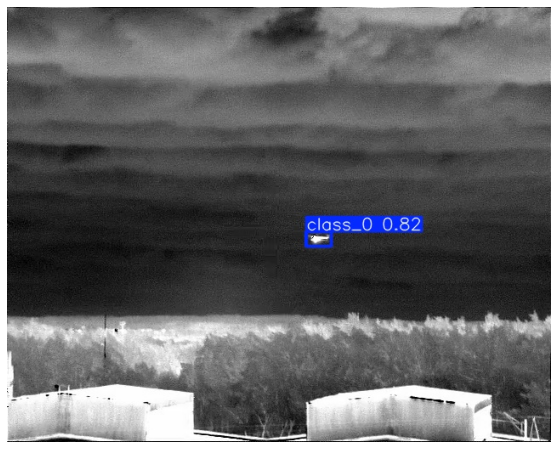

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res628', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor.jpg'),
                    show = False,
                    imgsz = 640,
                    show_labels = True,
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)

Results saved to runs\detect\YOLO10_res629


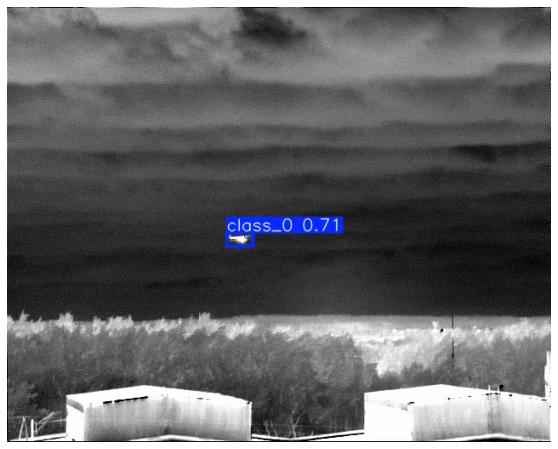

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res629', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-inv.jpg'),
                    show = False,
                    imgsz = 640,
                    show_labels = True,
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)

Results saved to runs\detect\YOLO10_res630


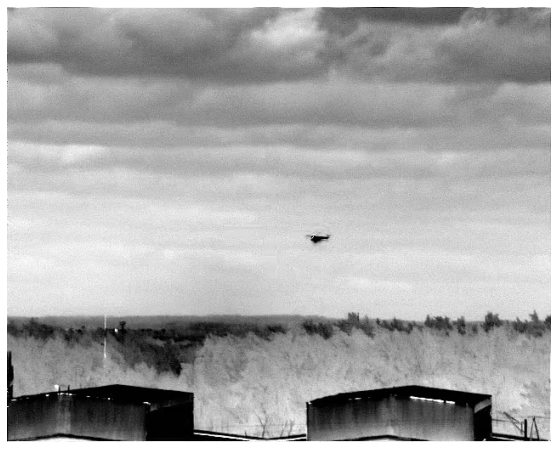

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res630', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-inv.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor-inv.jpg'),
                    show = False,
                    imgsz = 640,
                    show_labels = True,
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)

Results saved to runs\detect\YOLO10_res631


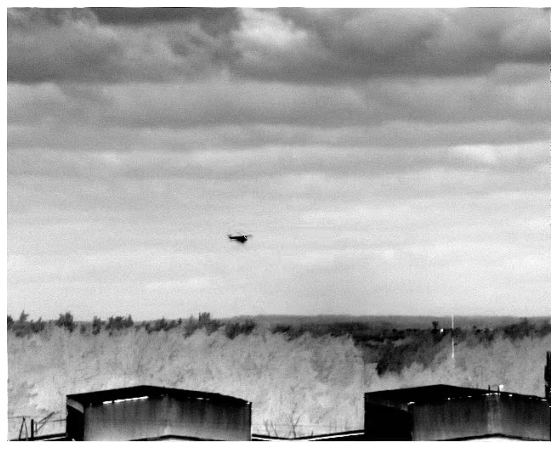

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res631', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor-inv.jpg'))
plt.axis('off')
plt.imshow(img);

##### inv - variants are not detected. we should add them into train-dataset

#### Large Dataset

In [ ]:
os.makedirs(os.path.join(project_path, 'large_dataset', 'train', 'images'))
os.makedirs(os.path.join(project_path, 'large_dataset', 'train', 'labels'))
os.makedirs(os.path.join(project_path, 'large_dataset', 'val', 'images'))
os.makedirs(os.path.join(project_path, 'large_dataset', 'val', 'labels'))

In [ ]:
# проверка директории
def tree(path=(os.path.join(project_path, 'large_dataset')), head='', tail=''):
    path = Path(path)
    if path.is_dir():
        print(head + path.name)
        entries = sorted(filter(Path.is_dir, path.iterdir()))
        for i, entry in enumerate(entries):
            if i < len(entries) - 1:
                tree(entry, tail + '├──', tail + '│  ')
            else:
                tree(entry, tail + '└──', tail + '   ')

tree()

large_dataset
├──train
│  ├──images
│  └──labels
└──val
   ├──images
   └──labels


In [ ]:
plane_image_count_df = pd.read_csv(os.path.join(project_path, 'plane_image_count_df.csv'))
plane_image_count_df

,plane_list,video_name,img_name,img_name_int
0,14052021_(10)@ds-0025-inv.jpg,14052021_(10)@ds-,['0025'],25
1,14052021_(t19)@ds-0061-aughor-inv.jpg,14052021_(t19)@ds-,['0061'],61
2,14052021_(t19)@ds-1291-inv.jpg,14052021_(t19)@ds-,['1291'],1291
3,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0462-inv.jpg,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-,['0462'],462
4,14052021_(t19)@ds-0852-aughor-inv.jpg,14052021_(t19)@ds-,['0852'],852
...,...,...,...,...
61607,14052021_(9)@ds-0934-aughor-inv.jpg,14052021_(9)@ds-,['0934'],934
61608,14052021_(t18)@ds-0718.jpg,14052021_(t18)@ds-,['0718'],718
61609,14052021_(10)@ds-0391-inv.jpg,14052021_(10)@ds-,['0391'],391
61610,14052021_(t36)@ds-1391.jpg,14052021_(t36)@ds-,['1391'],1391


In [ ]:
plane_image_count_df['video_name'].value_counts()

14052021_(9)@ds-                      8348
14052021_(t36)@ds-                    8348
14052021_(t18)@ds-                    7180
14052021_(t19)@ds-                    5676
14052021_(t20)@ds-                    3956
14052021_(t4)@ds-                     3900
14052021_(t17)@ds-                    3896
14052021_(t21)@ds-                    3836
14052021_(t3)@ds-                     3476
27042021_¡¿¿» 12_00 ßá¼«½ÑΓ âÇ@ds-    3364
14052021_(11)@ds-                     2604
14052021_(t14)@ds-                    1832
14052021_(10)@ds-                     1424
Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-                 1348
14052021_(t37)@ds-                    1080
14052021_(t16)@ds-                     812
14052021_(t15)@ds-                     304
æá¼«½ÑΓ êè ¬á¡á½ 1@ds-                 228
Name: video_name, dtype: int64

In [ ]:
video_name_list = list(plane_image_count_df['video_name'].value_counts().index)
video_name_list

['14052021_(9)@ds-',
 '14052021_(t36)@ds-',
 '14052021_(t18)@ds-',
 '14052021_(t19)@ds-',
 '14052021_(t20)@ds-',
 '14052021_(t4)@ds-',
 '14052021_(t17)@ds-',
 '14052021_(t21)@ds-',
 '14052021_(t3)@ds-',
 '27042021_¡¿¿» 12_00 ßá¼«½ÑΓ âÇ@ds-',
 '14052021_(11)@ds-',
 '14052021_(t14)@ds-',
 '14052021_(10)@ds-',
 'Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-',
 '14052021_(t37)@ds-',
 '14052021_(t16)@ds-',
 '14052021_(t15)@ds-',
 'æá¼«½ÑΓ êè ¬á¡á½ 1@ds-']

In [ ]:
for video_name in video_name_list[:-3:]:

    tab = plane_image_count_df[plane_image_count_df['video_name'] == video_name]
    tab_list = sorted(tab['img_name_int'].unique())

    rem_list = []

    # train
    idx_list = list(set(list(np.random.randint(0, len(tab_list), 220))))

    for i in range(len(idx_list)):
        im_num = '000' + str(tab_list[idx_list[i]])
        rem_list.append(tab_list[idx_list[i]])
        #image names
        simple_image = video_name + im_num[-4::] + '.jpg'
        inv_name = video_name + im_num[-4::] + '-inv' + '.jpg'
        aughor_name = video_name + im_num[-4::] + '-aughor' + '.jpg'
        aughor_inv_name = video_name + im_num[-4::] + '-aughor-inv' + '.jpg'

        # label names
        simple_label = video_name + im_num[-4::] + '.txt'
        inv_label = video_name + im_num[-4::] + '-inv' + '.txt'
        aughor_label = video_name + im_num[-4::] + '-aughor' + '.txt'
        aughor_inv_label = video_name + im_num[-4::] + '-aughor-inv' + '.txt'

        # копируем картинку
        shutil.copy2(os.path.join(plane_image_path, simple_image), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_image_path, inv_name), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_image_path, aughor_name), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_image_path, aughor_inv_name), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        # копируем label
        shutil.copy2(os.path.join(plane_label_path, simple_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_label_path, inv_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_label_path, aughor_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_label_path, aughor_inv_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)

    # val
    for i in range(len(rem_list)):
        tab_list.remove(rem_list[i])

    val_idx_list = list(set(list(np.random.randint(0, len(tab_list), 50))))

    for i in range(len(val_idx_list)):
        val_im_num = '000' + str(tab_list[val_idx_list[i]])
        #image names
        val_simple_image = video_name + val_im_num[-4::] + '.jpg'
        val_inv_name = video_name + val_im_num[-4::] + '-inv' + '.jpg'
        val_aughor_name = video_name + val_im_num[-4::] + '-aughor' + '.jpg'
        val_aughor_inv_name = video_name + val_im_num[-4::] + '-aughor-inv' + '.jpg'

        # label names
        val_simple_label = video_name + val_im_num[-4::] + '.txt'
        val_inv_label = video_name + val_im_num[-4::] + '-inv' + '.txt'
        val_aughor_label = video_name + val_im_num[-4::] + '-aughor' + '.txt'
        val_aughor_inv_label = video_name + val_im_num[-4::] + '-aughor-inv' + '.txt'

        # копируем картинку
        shutil.copy2(os.path.join(plane_image_path, val_simple_image), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_image_path, val_inv_name), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_image_path, val_aughor_name), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_image_path, val_aughor_inv_name), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        # копируем label
        shutil.copy2(os.path.join(plane_label_path, val_simple_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_label_path, val_inv_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_label_path, val_aughor_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(plane_label_path, val_aughor_inv_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)


In [ ]:
# проверка
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'train', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'train', 'labels'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'labels'))))

11312
11312
2772
2772


In [ ]:
# the same with helicopters
heli_image_count_df = pd.DataFrame(columns = ['heli_list', 'video_name'])
heli_image_count_df['heli_list'] = heli_list

video_name = []
for i in range(len(heli_image_count_df)):
    img_name = re.sub(r'(?<=@ds-)[\d]{4}[\d\w\-]*\.jpg', '', heli_image_count_df['heli_list'][i])
    video_name.append(img_name)

heli_image_count_df['video_name'] = video_name

heli_image_count_df['img_name'] = ''
img_name_list = []
for i in range(len(heli_image_count_df)):
    img_name = re.findall(r'(?<=@ds-)[\d]{4}', heli_image_count_df['heli_list'][i])
    img_name_list.append(img_name)

heli_image_count_df['img_name'] = img_name_list

heli_image_count_df['img_name_int'] = ''
for i in range(len(heli_image_count_df)):
    heli_image_count_df['img_name_int'][i] = heli_image_count_df['img_name'][i][0]

heli_image_count_df

,heli_list,video_name,img_name,img_name_int
0,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0001-aughor-inv.jpg,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-,[0001],0001
1,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0001-aughor.jpg,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-,[0001],0001
2,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0001-inv.jpg,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-,[0001],0001
3,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0001.jpg,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-,[0001],0001
4,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0002-aughor-inv.jpg,27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-,[0002],0002
...,...,...,...,...
19955,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0329.jpg,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-,[0329],0329
19956,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0330-aughor-inv...,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-,[0330],0330
19957,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0330-aughor.jpg,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-,[0330],0330
19958,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0330-inv.jpg,27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-,[0330],0330


In [ ]:
heli_image_count_df.to_csv(os.path.join(project_path, 'heli_image_count_df.csv'),index = False)

In [ ]:
heli_image_count_df['video_name'].value_counts()

27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-                  5288
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-      4868
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-             3760
27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-                  2852
27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-    1956
27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-             1236
Name: video_name, dtype: int64

In [ ]:
heli_video_name_list = list(heli_image_count_df['video_name'].value_counts().index)
heli_video_name_list

['27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-',
 '27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ@ds-',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-',
 '27042021_¡¿¿»_óÑαΓ«½ÑΓ@ds-',
 '27042021_¡¿¿»_óÑαΓ«½ÑΓ »α«ñ«½ªÑ¡¿Ñ 2@ds-',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-']

In [ ]:
for video_name in heli_video_name_list[:-1:]:

    tab = heli_image_count_df[heli_image_count_df['video_name'] == video_name]
    tab_list = sorted(tab['img_name_int'].unique())

    rem_list = []

    # train
    idx_list = list(set(list(np.random.randint(0, len(tab_list), 220))))

    for i in range(len(idx_list)):
        im_num = '000' + str(tab_list[idx_list[i]])
        rem_list.append(tab_list[idx_list[i]])
        #image names
        simple_image = video_name + im_num[-4::] + '.jpg'
        inv_name = video_name + im_num[-4::] + '-inv' + '.jpg'
        aughor_name = video_name + im_num[-4::] + '-aughor' + '.jpg'
        aughor_inv_name = video_name + im_num[-4::] + '-aughor-inv' + '.jpg'

        # label names
        simple_label = video_name + im_num[-4::] + '.txt'
        inv_label = video_name + im_num[-4::] + '-inv' + '.txt'
        aughor_label = video_name + im_num[-4::] + '-aughor' + '.txt'
        aughor_inv_label = video_name + im_num[-4::] + '-aughor-inv' + '.txt'

        # копируем картинку
        shutil.copy2(os.path.join(heli_image_path, simple_image), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_image_path, inv_name), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_image_path, aughor_name), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_image_path, aughor_inv_name), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)
        # копируем label
        shutil.copy2(os.path.join(heli_label_path, simple_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_label_path, inv_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_label_path, aughor_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_label_path, aughor_inv_label), os.path.join(project_path, 'large_dataset', 'train', 'labels'), follow_symlinks=True)

    # val
    for i in range(len(rem_list)):
        tab_list.remove(rem_list[i])

    val_idx_list = list(set(list(np.random.randint(0, len(tab_list), 50))))

    for i in range(len(val_idx_list)):
        val_im_num = '000' + str(tab_list[val_idx_list[i]])
        #image names
        val_simple_image = video_name + val_im_num[-4::] + '.jpg'
        val_inv_name = video_name + val_im_num[-4::] + '-inv' + '.jpg'
        val_aughor_name = video_name + val_im_num[-4::] + '-aughor' + '.jpg'
        val_aughor_inv_name = video_name + val_im_num[-4::] + '-aughor-inv' + '.jpg'

        # label names
        val_simple_label = video_name + val_im_num[-4::] + '.txt'
        val_inv_label = video_name + val_im_num[-4::] + '-inv' + '.txt'
        val_aughor_label = video_name + val_im_num[-4::] + '-aughor' + '.txt'
        val_aughor_inv_label = video_name + val_im_num[-4::] + '-aughor-inv' + '.txt'

        # копируем картинку
        shutil.copy2(os.path.join(heli_image_path, val_simple_image), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_image_path, val_inv_name), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_image_path, val_aughor_name), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_image_path, val_aughor_inv_name), os.path.join(project_path, 'large_dataset', 'val', 'images'), follow_symlinks=True)
        # копируем label
        shutil.copy2(os.path.join(heli_label_path, val_simple_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_label_path, val_inv_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_label_path, val_aughor_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)
        shutil.copy2(os.path.join(heli_label_path, val_aughor_inv_label), os.path.join(project_path, 'large_dataset', 'val', 'labels'), follow_symlinks=True)


In [ ]:
# проверка
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'train', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'train', 'labels'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'labels'))))

15200
15196
3712
3712


In [ ]:
# добавим в трейн еще backgrounds
empty_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', 'backgrounds', 'images')

empty_list = os.listdir(empty_path)

for i in range(len(empty_list)):
    shutil.copy2(os.path.join(empty_path, empty_list[i]), os.path.join(project_path, 'large_dataset', 'train', 'images'), follow_symlinks=True)

In [ ]:
# проверка
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'train', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'train', 'labels'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'images'))))
print(len(os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'labels'))))

15416
15196
3712
3712


In [ ]:
# create yaml
data = {
    'path': os.path.join(project_path, 'large_dataset'),  # dataset root dir
    'train': os.path.join(project_path, 'large_dataset', 'train'),  # train images
    'val': os.path.join(project_path, 'large_dataset', 'val'),  # val images

    # Classes (1 class)
    #names: ['plane', 'helicopter']
    'nc': 2
}

with open(os.path.join(project_path, 'large_dataset.yml'), 'w+') as file:
    yaml.dump(data, file, default_flow_style=False, sort_keys=False)

In [ ]:
# проверим, что записалось
with open(os.path.join(project_path, 'large_dataset.yml'), 'r') as file:
    data = yaml.load(file, Loader=yaml.FullLoader)
    print(data)

{'path': 'F:\\DS\\Хахатон_10.2024\\large_dataset', 'train': 'F:\\DS\\Хахатон_10.2024\\large_dataset\\train', 'val': 'F:\\DS\\Хахатон_10.2024\\large_dataset\\val', 'nc': 2}


In [ ]:
# train
from ultralytics import YOLO

large_model = YOLO("yolov10n.pt") # попробуем самую маленькую модель
large_model.info()

YOLOv10n summary: 385 layers, 2,775,520 parameters, 0 gradients, 8.7 GFLOPs


(385, 2775520, 0, 8.7404288)

In [ ]:
torch.cuda.empty_cache()
large_results = large_model.train(data = os.path.join(project_path, 'large_dataset.yml'), optimizer='Adam', lr0=0.003,
                                  device=device, epochs = 10, single_cls=True, verbose = True, amp=False,
                                  save_dir = os.path.join(project_path, 'detect'))

New https://pypi.org/project/ultralytics/8.3.11 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.87  Python-3.9.12 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov10n.pt, data=F:\DS\_10.2024\large_dataset.yml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train18, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=No

train: Scanning F:\DS\Хахатон_10.2024\large_dataset\train\labels... 15196 images, 220 backgrounds, 0 corrupt: 100%|██████████| 15416/15416 [00:42<00:00, 362.55it/s] 


train: New cache created: F:\DS\_10.2024\large_dataset\train\labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning F:\DS\Хахатон_10.2024\large_dataset\val\labels... 3712 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3712/3712 [00:17<00:00, 209.76it/s]


val: New cache created: F:\DS\_10.2024\large_dataset\val\labels.cache
Plotting labels to runs\detect\train18\labels.jpg... 
optimizer: Adam(lr=0.003, momentum=0.937) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train18
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.78G      3.188      1.761      1.847          8        640: 100%|██████████| 964/964 [38:11<00:00,  2.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [02:23<00:00,  1.24s/it]

                   all       3712       3712      0.781      0.744      0.812      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.74G      3.007      1.351      1.819          8        640: 100%|██████████| 964/964 [38:03<00:00,  2.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [03:25<00:00,  1.77s/it]

                   all       3712       3712      0.874      0.888      0.941      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.74G       2.77       1.18      1.771          8        640: 100%|██████████| 964/964 [37:37<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [02:17<00:00,  1.18s/it]

                   all       3712       3712      0.923       0.93       0.97      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.74G      2.589       1.08      1.739          8        640: 100%|██████████| 964/964 [38:24<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [03:09<00:00,  1.63s/it]

                   all       3712       3712      0.839      0.798      0.866      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.74G      2.421     0.9854      1.717          8        640: 100%|██████████| 964/964 [41:53<00:00,  2.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [02:18<00:00,  1.19s/it]

                   all       3712       3712      0.917      0.929       0.97      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      6.74G      2.271     0.9139      1.696          8        640: 100%|██████████| 964/964 [43:18<00:00,  2.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [03:13<00:00,  1.67s/it]

                   all       3712       3712      0.952      0.935      0.978      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.74G      2.178      0.865       1.68          8        640: 100%|██████████| 964/964 [42:46<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [03:14<00:00,  1.68s/it]

                   all       3712       3712      0.953      0.942      0.981      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      6.74G       2.07     0.8223      1.662          8        640: 100%|██████████| 964/964 [50:22<00:00,  3.13s/it] 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [02:49<00:00,  1.46s/it]

                   all       3712       3712      0.922      0.895       0.96      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.74G      1.969     0.7885      1.653          8        640: 100%|██████████| 964/964 [41:04<00:00,  2.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [02:17<00:00,  1.19s/it]

                   all       3712       3712      0.958      0.964      0.987      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      6.74G      1.872     0.7396      1.636          8        640: 100%|██████████| 964/964 [40:17<00:00,  2.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [03:09<00:00,  1.64s/it]

                   all       3712       3712      0.958      0.968      0.987      0.766



10 epochs completed in 7.369 hours.
Optimizer stripped from runs\detect\train18\weights\last.pt, 5.7MB
Optimizer stripped from runs\detect\train18\weights\best.pt, 5.7MB

Validating runs\detect\train18\weights\best.pt...
Ultralytics YOLOv8.2.87  Python-3.9.12 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 4096MiB)
YOLOv10n summary (fused): 285 layers, 2,695,196 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 116/116 [01:13<00:00,  1.58it/s]


                   all       3712       3712      0.961      0.964      0.987      0.766
               class_0       3712       3712      0.961      0.964      0.987      0.766
Speed: 0.3ms preprocess, 15.5ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train18


In [ ]:
val_list = os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'images'))

plane_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'images')
heli_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'images')

plane_img_listdir = os.listdir(plane_img_path)
heli_img_listdir = os.listdir(heli_img_path)

plane_label_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'labels')
heli_label_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'labels')

plane_label_listdir = os.listdir(plane_label_path)
heli_label_listdir = os.listdir(heli_label_path)

In [ ]:
from ultralytics import YOLO
model = YOLO(os.path.join(os.curdir, 'runs', 'detect', 'train18', 'weights', 'best.pt'))

In [ ]:
# inference check

res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507.jpg'),
                    show = False,
                    imgsz = 640,
                    show_boxes = True,
                    show_labels = True,
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0507.jpg: 512x640 1 class_0, 62.9ms
Speed: 15.6ms preprocess, 62.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res635


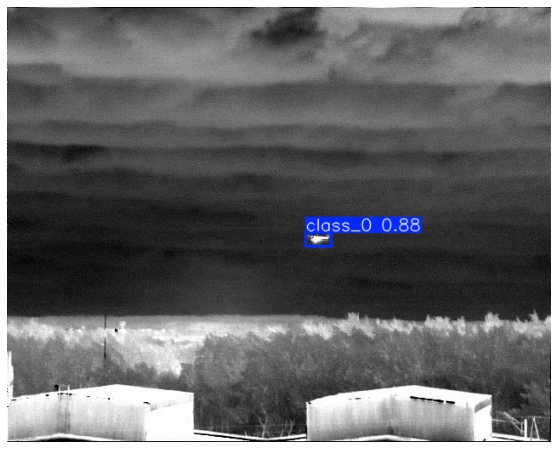

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res635', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor.jpg'),
                    show = False,
                    imgsz = 640,
                    show_boxes = True,
                    show_labels = False,    #!!!!!!
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0507-aughor.jpg: 512x640 1 class_0, 80.2ms
Speed: 9.3ms preprocess, 80.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res636


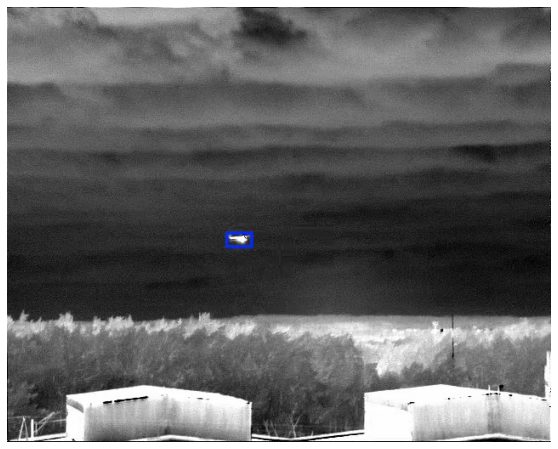

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res636', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-inv.jpg'),
                    show = False,
                    imgsz = 640,
                    show_boxes = True,
                    show_labels = False,         #!!!!!!
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0507-inv.jpg: 512x640 1 class_0, 83.1ms
Speed: 7.6ms preprocess, 83.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res641


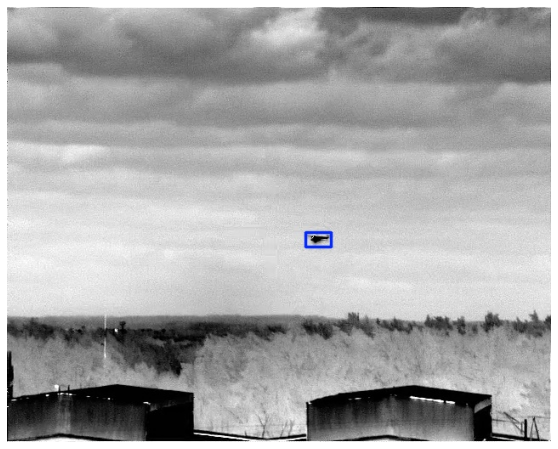

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res641', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-inv.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = model.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor-inv.jpg'),
                    show = False,
                    imgsz = 640,
                    show_boxes = True,
                    show_labels = False,      #!!!!!!
                    save = True,
                    name = "YOLO10_res",
                    conf = 0.3,
                    max_det = 2)


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0507-aughor-inv.jpg: 512x640 1 class_0, 73.8ms
Speed: 6.0ms preprocess, 73.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs\detect\YOLO10_res638


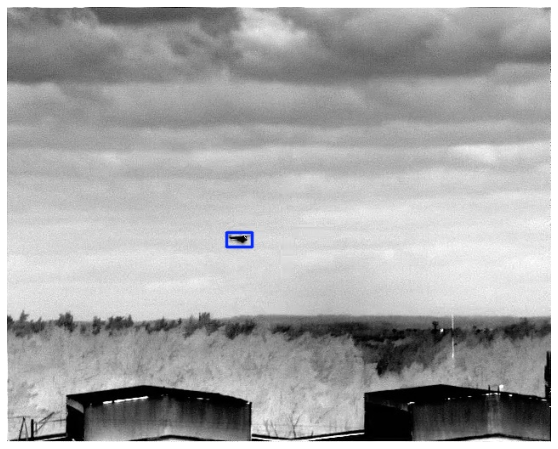

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res638', '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507-aughor-inv.jpg'))
plt.axis('off')
plt.imshow(img);